# **Preparación de los datos**


In [1]:
#Librerias que vamos a usar a lo largo del EDA
import numpy as np
import datetime as dt
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from collections import Counter
from scipy.stats import chi2_contingency, pearsonr, ttest_ind, f_oneway
from utils import plot_categorical_numerical_relationship, plot_grouped_boxplots, plot_multiple_boxplots,\
     plot_categorical_relationship_fin,plot_grouped_histograms, cardi, plot_numerical_histograms, \
     pinta_distribucion_categoricas,plot_categorical_numerical_histograms,plot_categorical_numerical_boxplots

# **Carga de la base de datos y visualización inicial**

In [2]:
#Llamamos al csv y creamos el df de perfil turistico
df_perfil_turistico = pd.read_csv("./data/Perfil_turístico.csv", sep=";", encoding="latin1")
#LIMPIEZA DE LOS DATOS
# Sexo
df_perfil_turistico["Sexo"] = df_perfil_turistico["Sexo"].replace({1: "Hombre", 6: "Mujer"})
#Nivel educativo
df_perfil_turistico["Nivel_educativo"] = df_perfil_turistico["Nivel_educativo"].replace({1:"Sin estudios", 2:"Estudios primarios", 3:"Estudios secundarios", 4:"Estudios superiores"})
#Situacion laboral
df_perfil_turistico["Situacion_laboral"] = df_perfil_turistico["Situacion_laboral"].replace({ 1:"Asalariado", 2:"Autonomo", 3:"Empresario_peque", 4:"Empresario_grande",
5:"Desempleado", 6:"Estudiante", 7:"Jubilado", 8:"Incapacitado", 9:"Militar", 10:"Dependients", 11:"Otros"})
#Ingresos
df_perfil_turistico["Ingresos"] = df_perfil_turistico["Ingresos"].replace({1:"Menos 25.000", 2:"25.000-49.999",3:"50.000-74.999", 4:"+75.000"})
#Tipo de alojamiento
df_perfil_turistico["Tipo_alojamiento"] = df_perfil_turistico["Tipo_alojamiento"].replace({1:"Hotel 1-2-3*", 2:"Hotel 4*",3:"Hotel 5*", 4:"Apartamento/Villa", 5:"Vivienda/airbnb", 6:"Alojamiento privado", 7:"Alojamiento rural"})
#Repetiría
df_perfil_turistico["Repetiria"] = df_perfil_turistico["Repetiria"].replace({1:"(1)", 2:"(2)",3:"(3)", 4:"(4)", 5:"(5)", 6:"(6)", 7:"(7)",8:"(8)",9:"(9)",10:"(10)"})
#Calificacion
df_perfil_turistico["Calificacion"] = df_perfil_turistico["Calificacion"].replace({1:"Mucho peor de lo esperado", 2:"Peor de lo esperado",3:"A la altura de las expectativas", 4:"Mejor de lo esperado", 5:"Mucho mejor de lo esperado"})
#Creamos una columna con el tipo de acompañante para tener en la misma columna el "modo_viaje" y asi estudiarla mejor
columnas_tipo_acompañante = ["Viaja_solo", "Viaja_pareja", "Viaja_hijo", "Viaja_amigos", "Viaja_otros"]
df_perfil_turistico["Modo_viaje"] = df_perfil_turistico.apply(lambda row: ', '.join(col for col in columnas_tipo_acompañante if row[col] == "Si"), axis=1)
df_perfil_turistico = df_perfil_turistico.drop(columns=["Viaja_pareja","Viaja_hijo","Viaja_otros","Viaja_solo","Viaja_amigos"])
#Unificación columna de gastos
df_perfil_turistico["Gastos_totales"] = (df_perfil_turistico["Coste_vuelos"] +df_perfil_turistico["Coste_alojamiento"] +df_perfil_turistico["Gastos"])
# Convertir algunas columnas a float
df_perfil_turistico["Edad"] = df_perfil_turistico["Edad"].astype(float)
#ESTUDIO DE LOS DATOS
variables_categoricas=["Sexo","Nacionalidad","Tipo_alojamiento","Calificacion","Repetiria","Nivel_educativo","Situacion_laboral","Ingresos", "Modo_viaje"]
#Datos prepandemia
df_2019 = df_perfil_turistico[df_perfil_turistico['Año'] == 2019]
#Datos postpandemia
df_2022 = df_perfil_turistico[df_perfil_turistico['Año'] == 2022]
#Definimos grupos de variables
variables_categoricas=["Sexo","Nacionalidad","Tipo_alojamiento","Calificacion","Repetiria","Nivel_educativo","Situacion_laboral","Ingresos", "Modo_viaje"]
variables_numericas=["Edad","Noches","Coste_vuelos","Coste_alojamiento","Gastos","Horas_fuera_alojamiento","Visitas_totales_Islas","Visitas_total_GC","Personas_hogar"]

Una vez cargados los datos y realizado el tratamiento correspondiente, presentamos un análisis bivariante completo. Dado que en el estudio principal contamos con un elevado número de variables categóricas (9) y numéricas (9), no es posible profundizar en todas las combinaciones posibles. Por este motivo, se ha optado por desarrollar un notebook específico para este análisis. Esto nos ha permitido obtener una visión más clara de dichas combinaciones y extraer patrones importantes que serán útiles para el análisis principal.

# ***Análisis bivariantes***

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (2) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


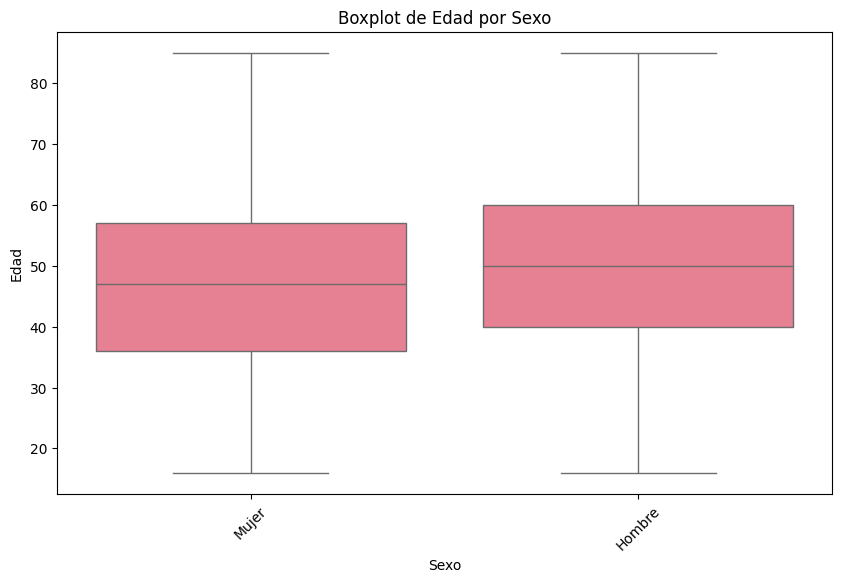

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (2) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


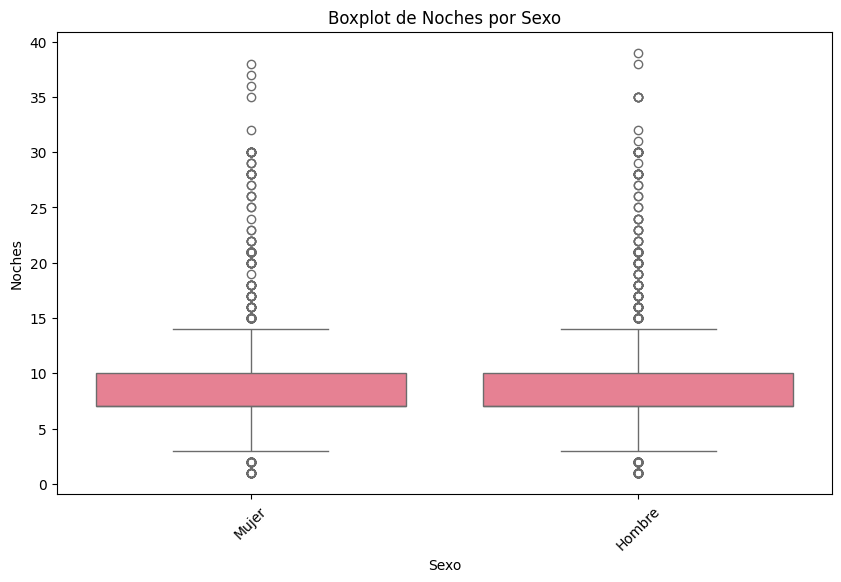

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (2) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


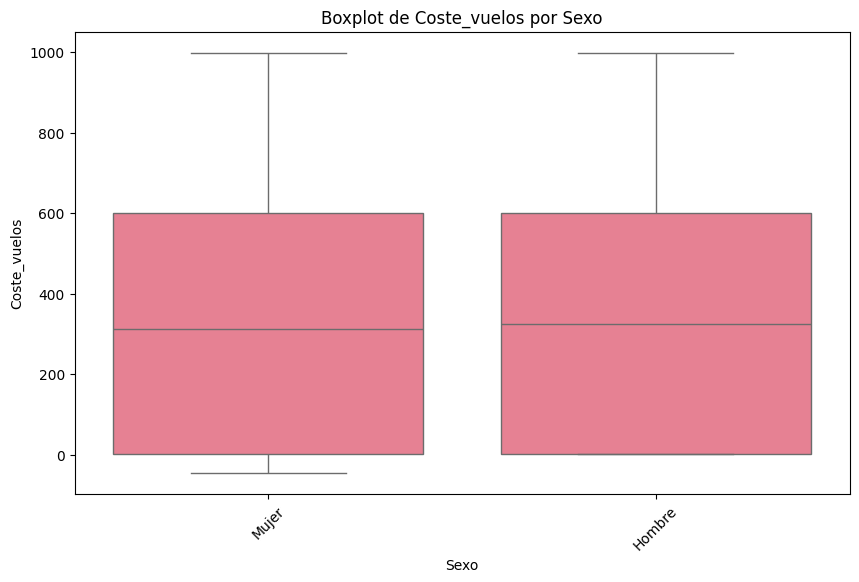

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (2) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


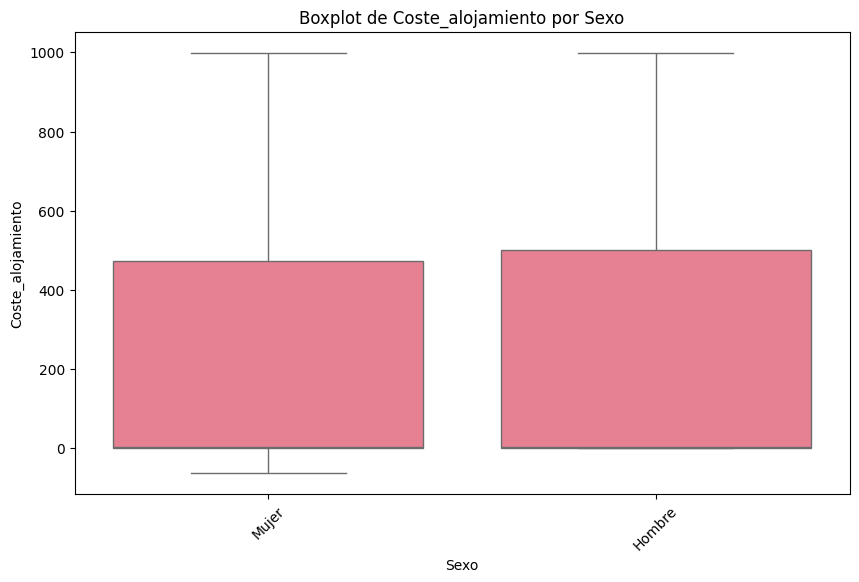

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (2) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


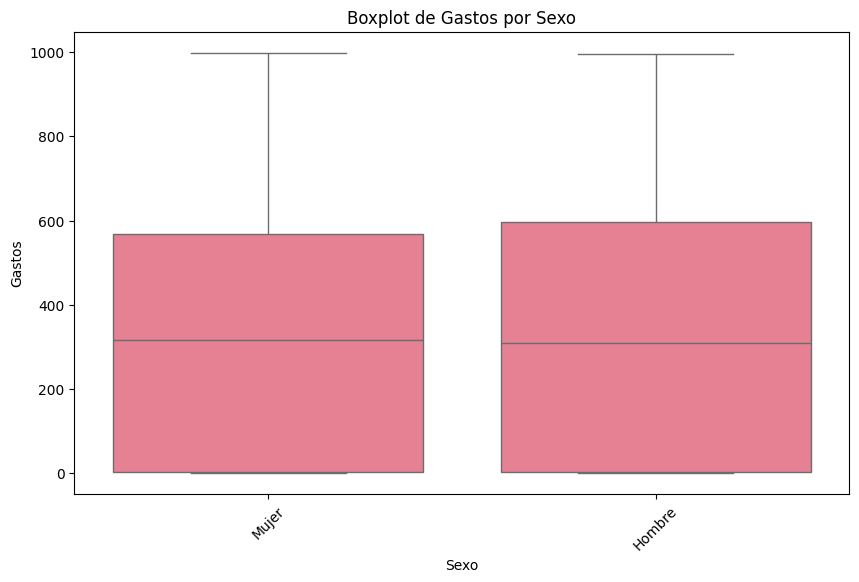

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (2) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


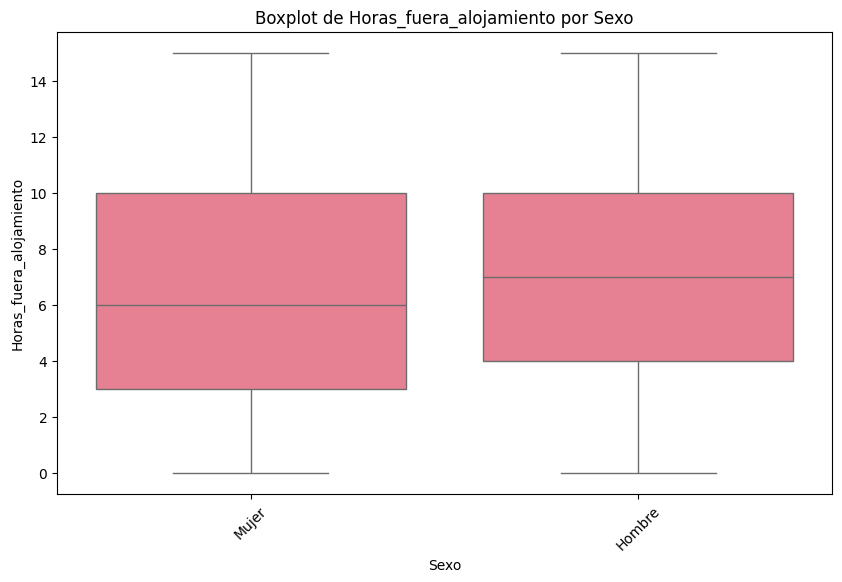

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (2) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


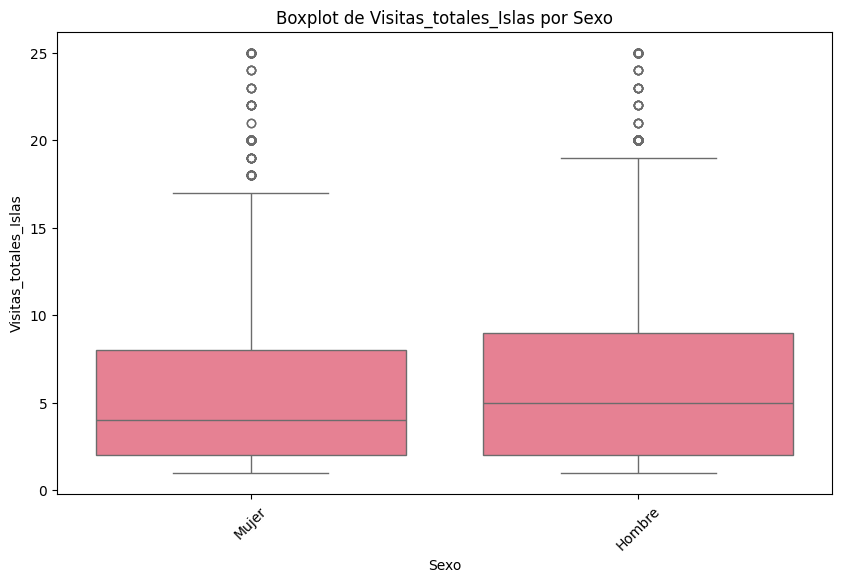

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (2) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


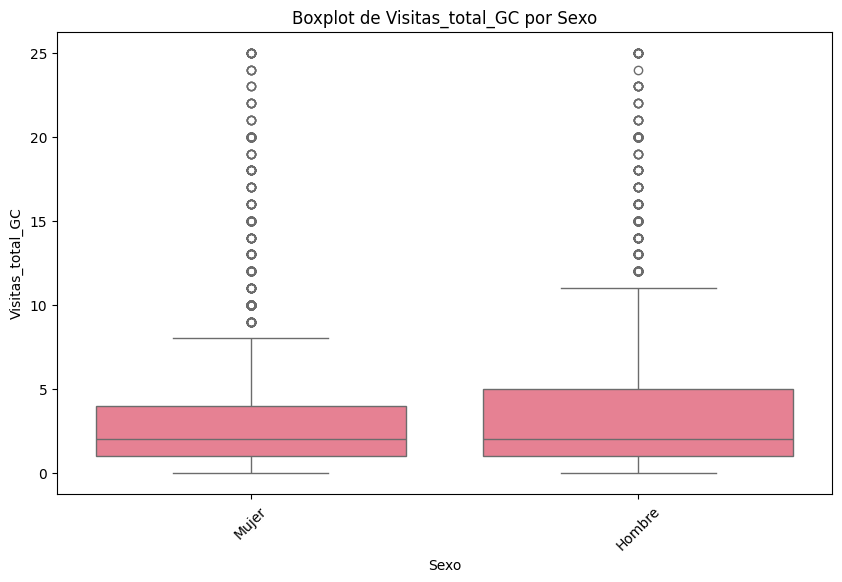

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (2) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


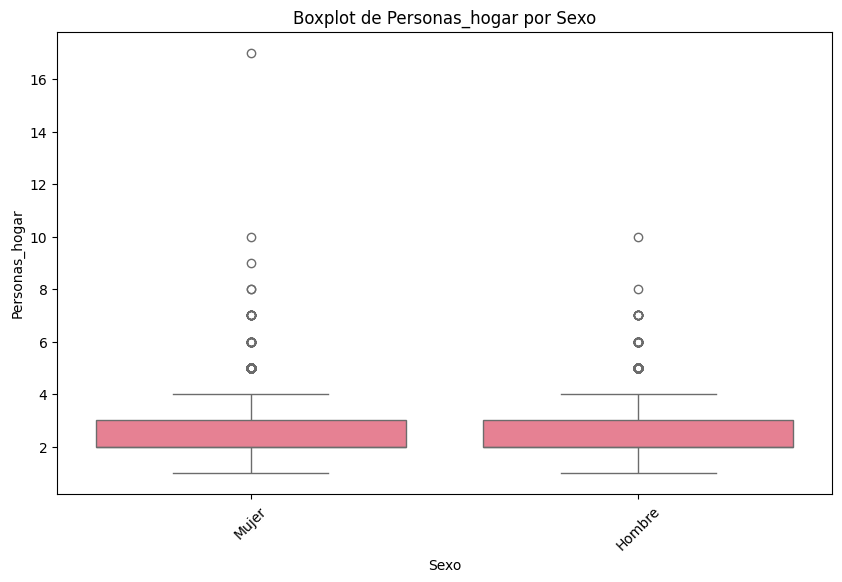

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (14) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


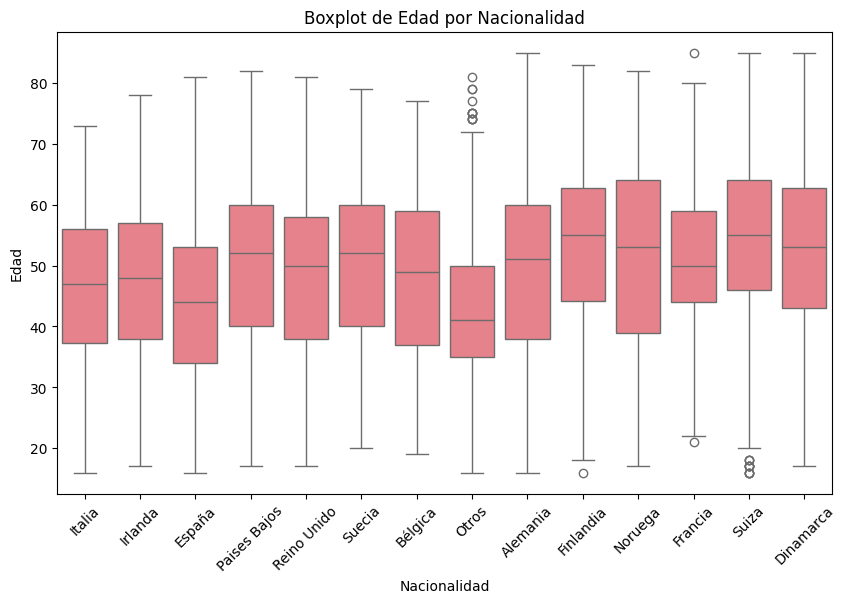

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (14) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


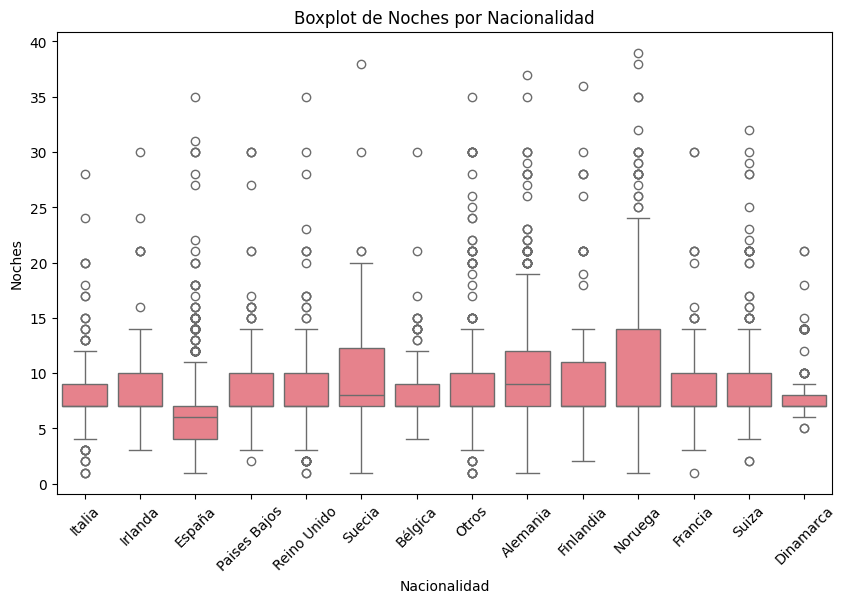

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (14) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


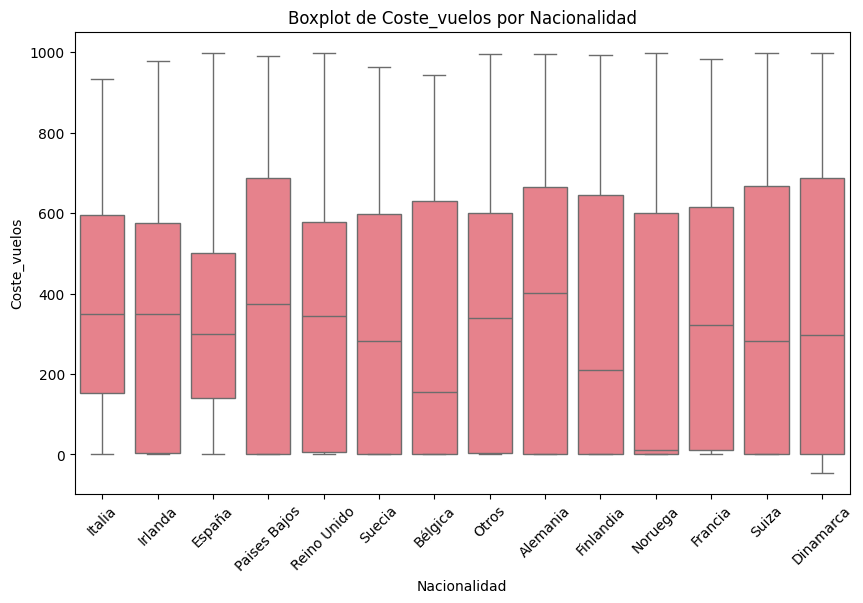

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (14) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


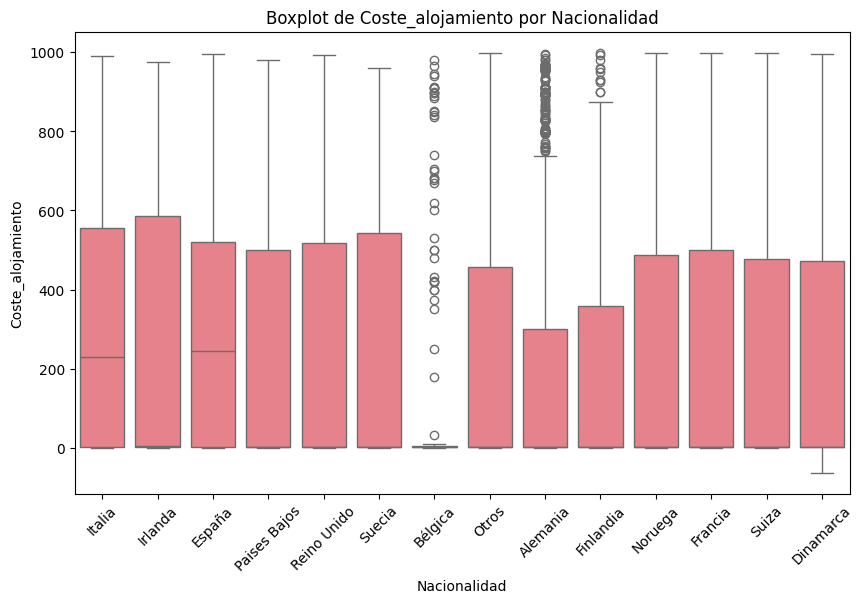

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (14) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


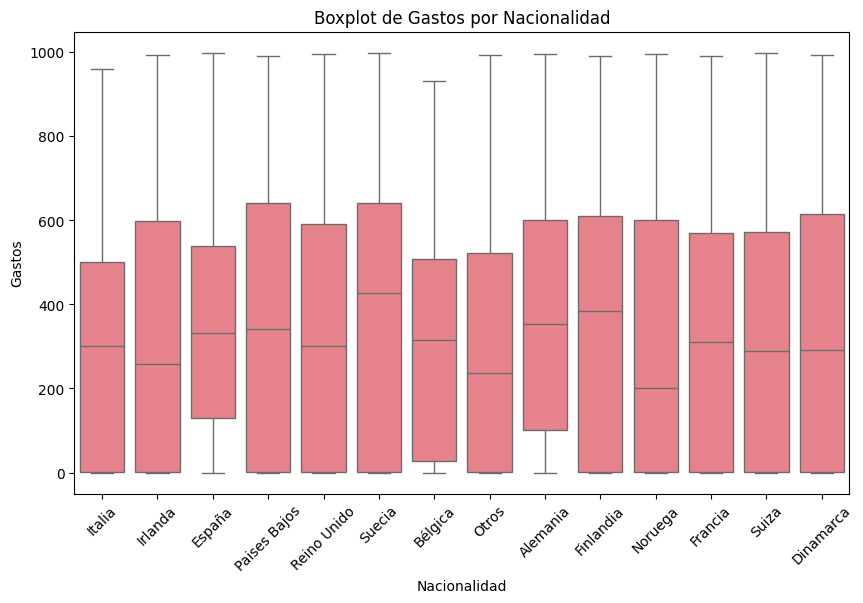

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (14) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


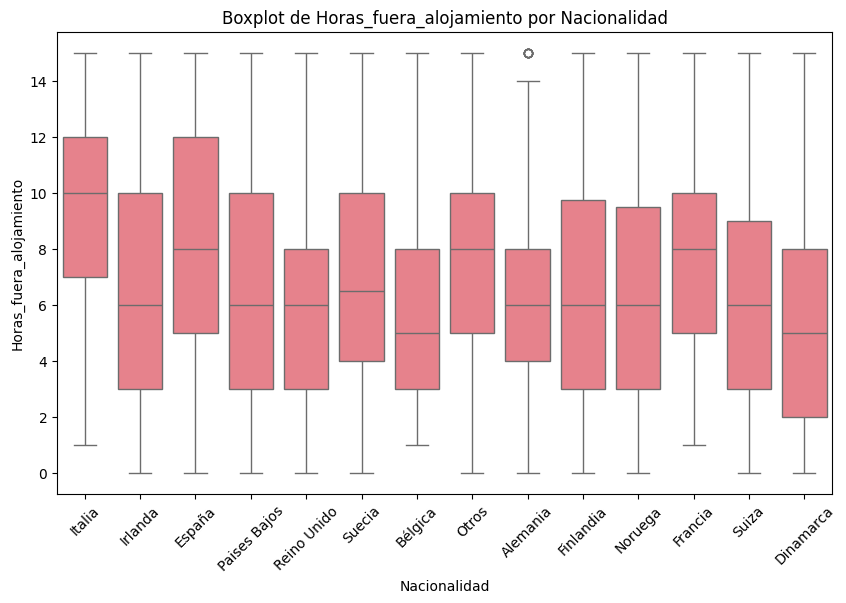

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (14) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


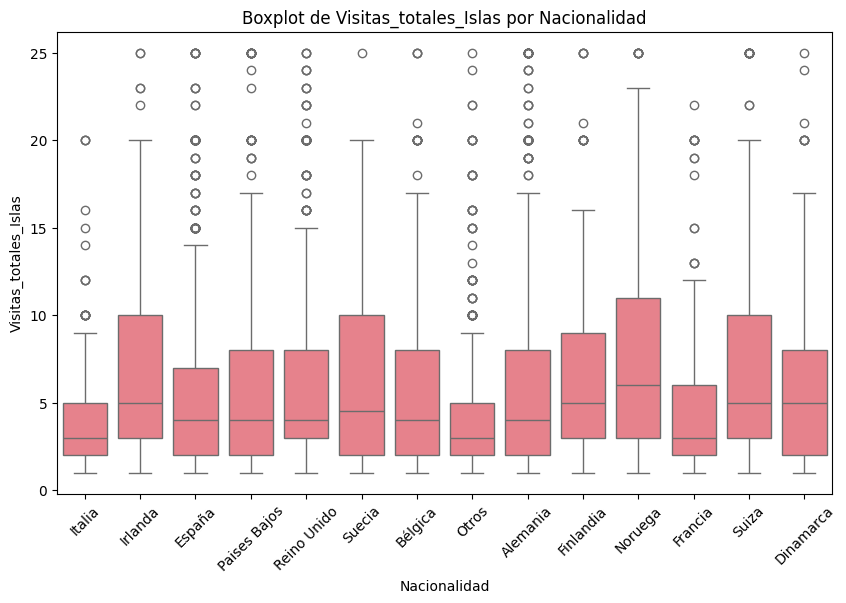

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (14) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


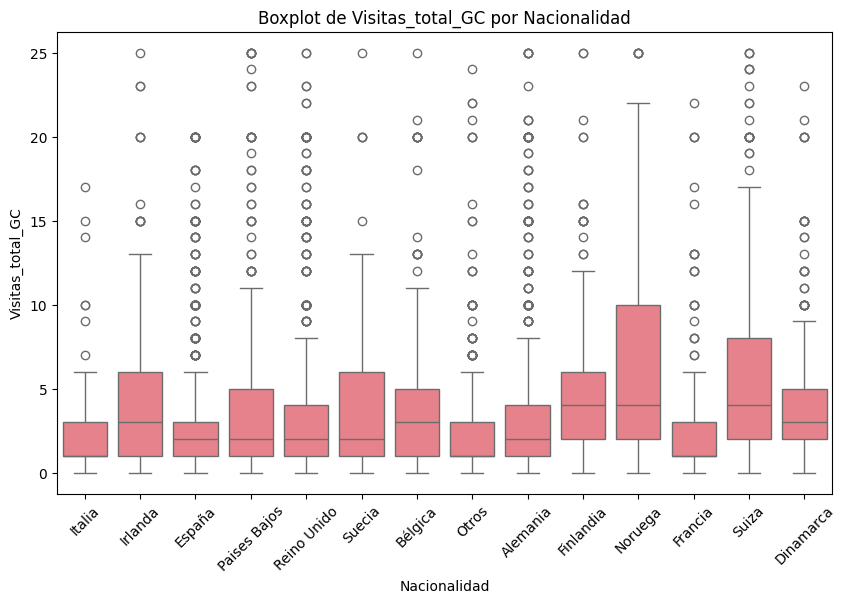

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (14) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


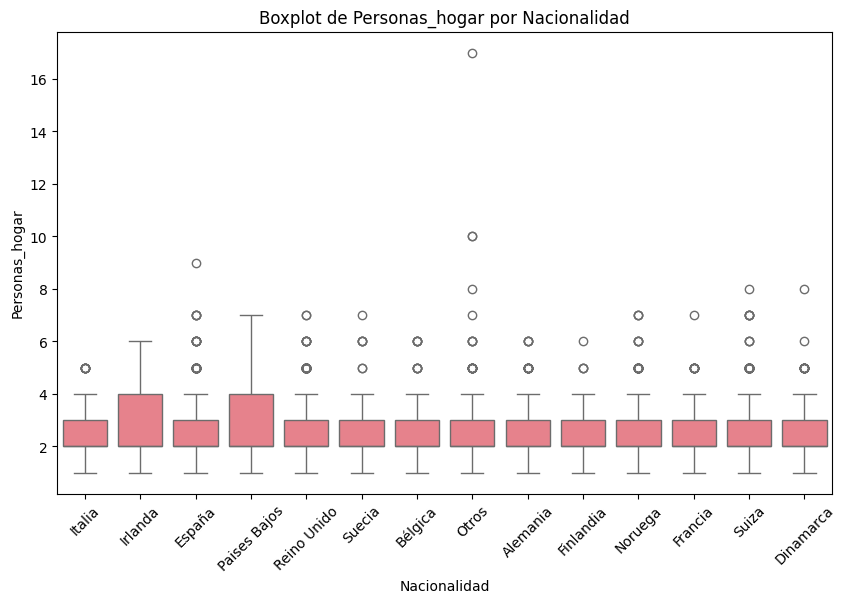

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (7) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


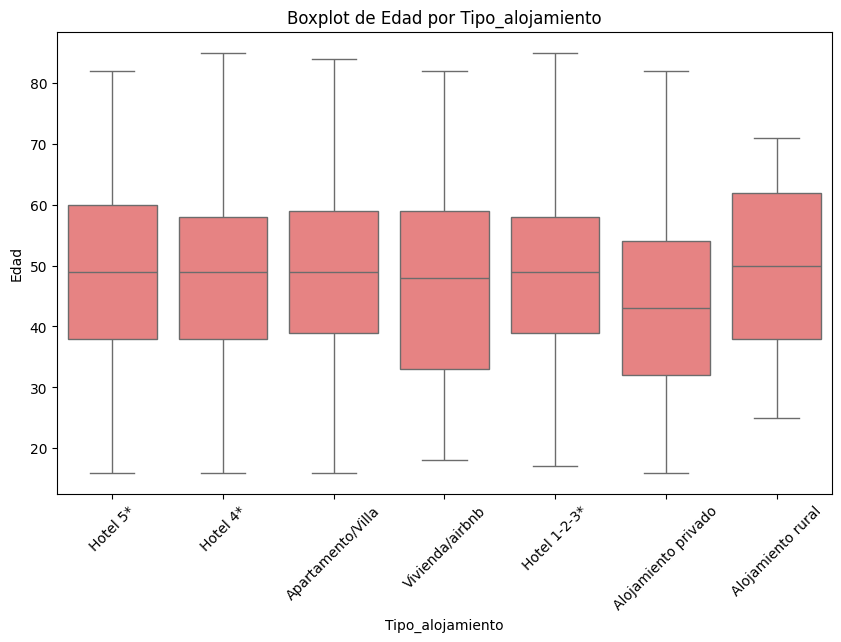

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (7) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


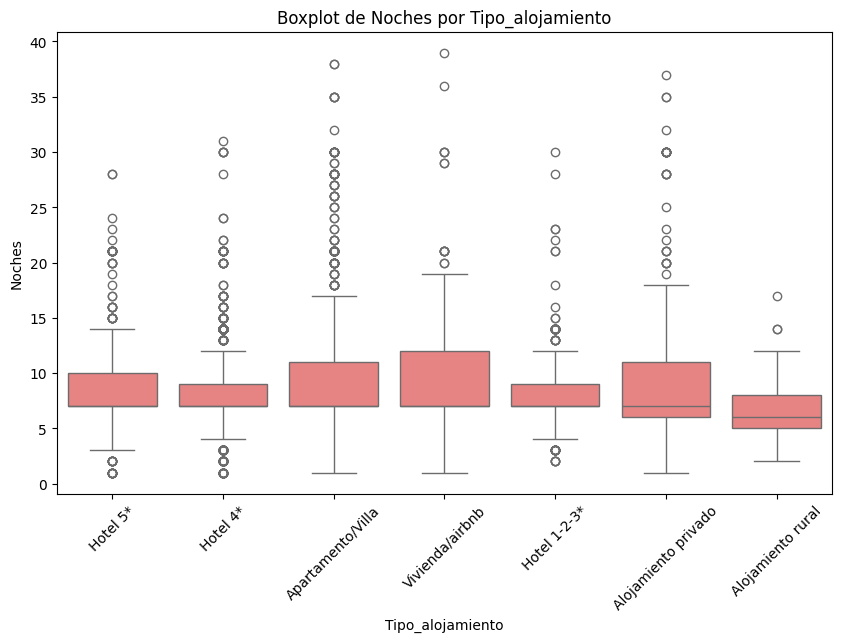

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (7) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


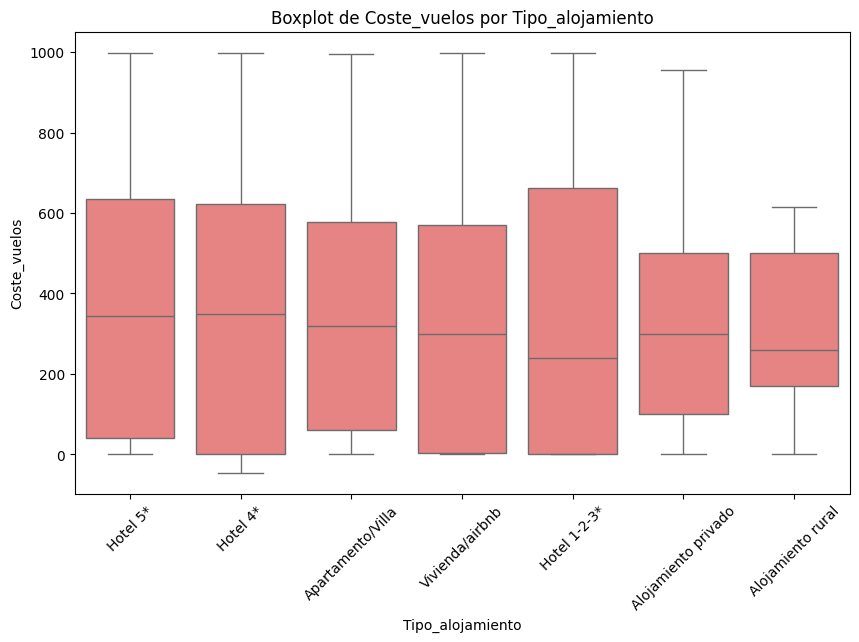

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (7) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


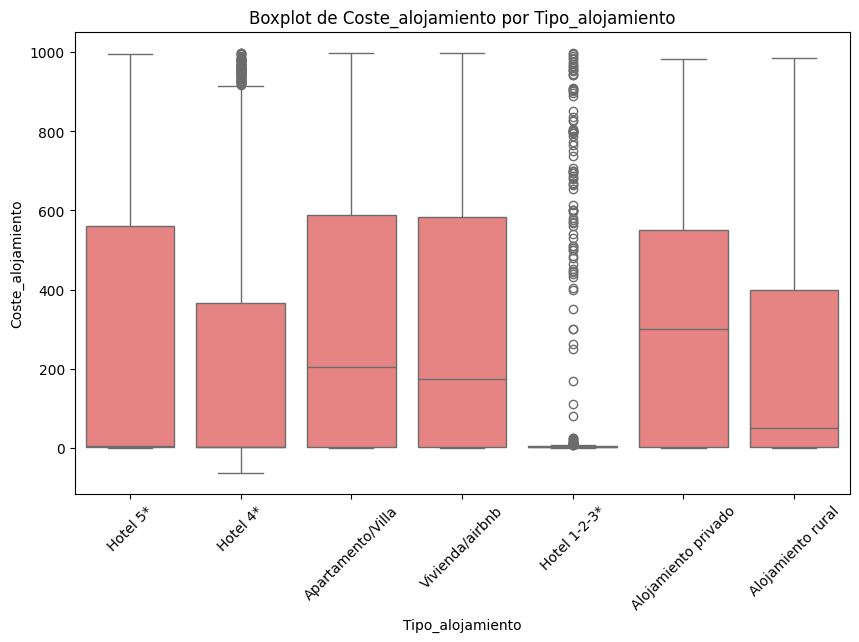

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (7) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


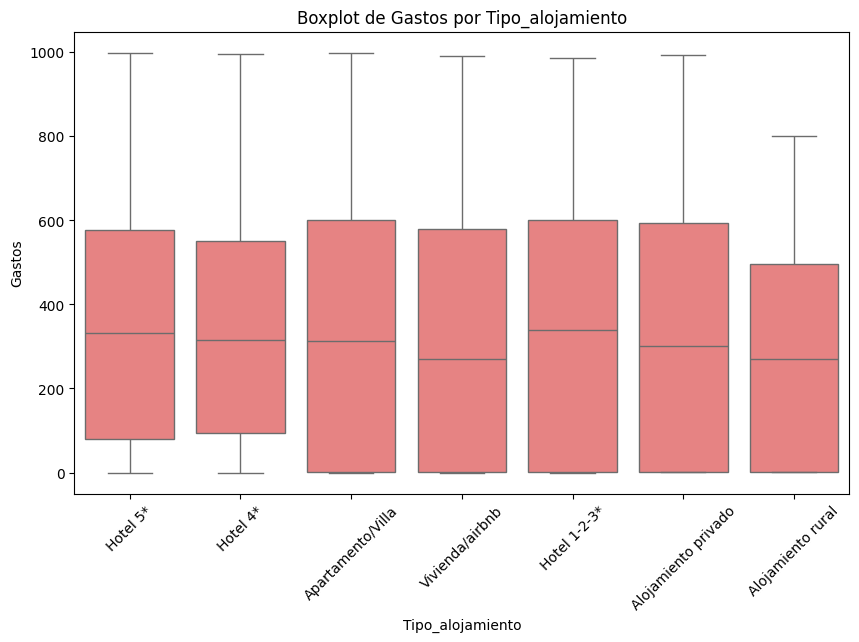

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (7) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


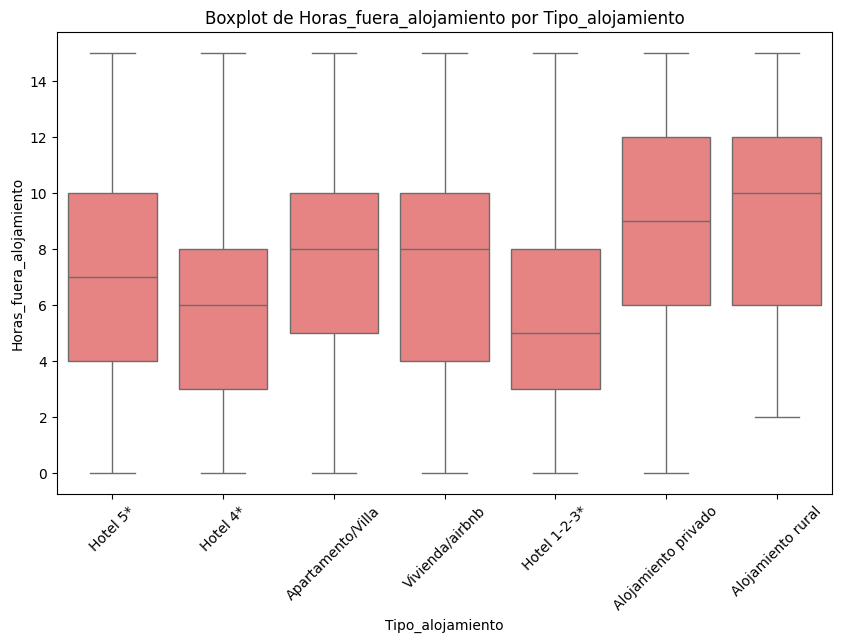

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (7) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


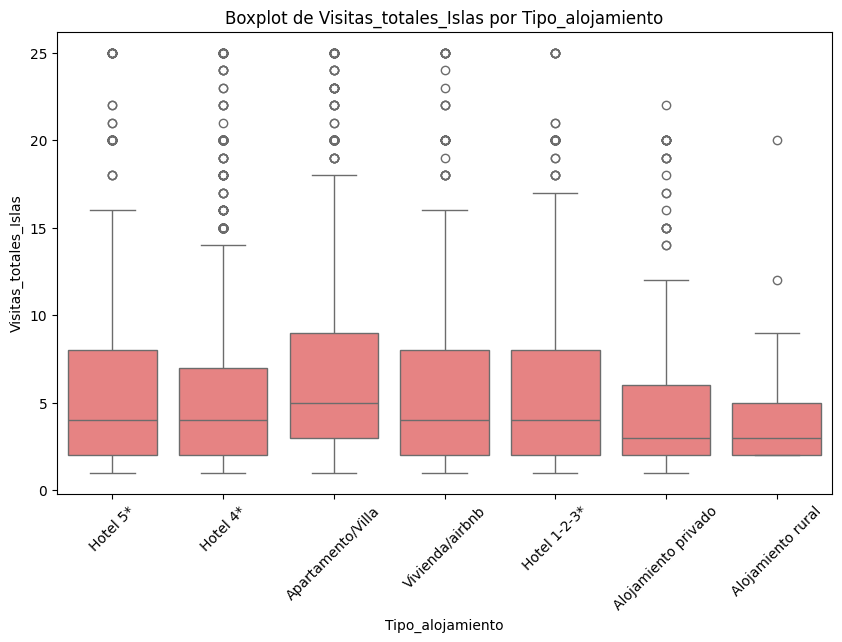

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (7) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


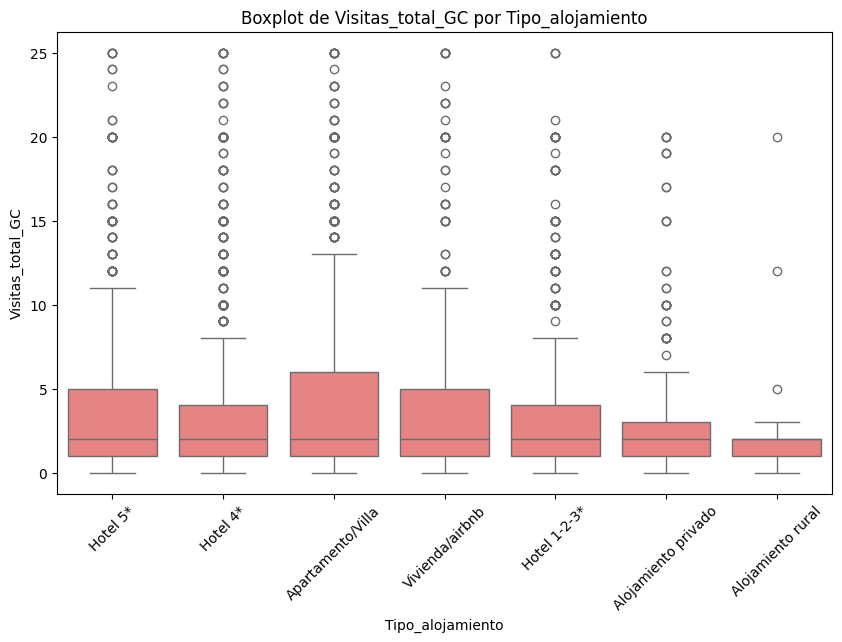

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (7) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


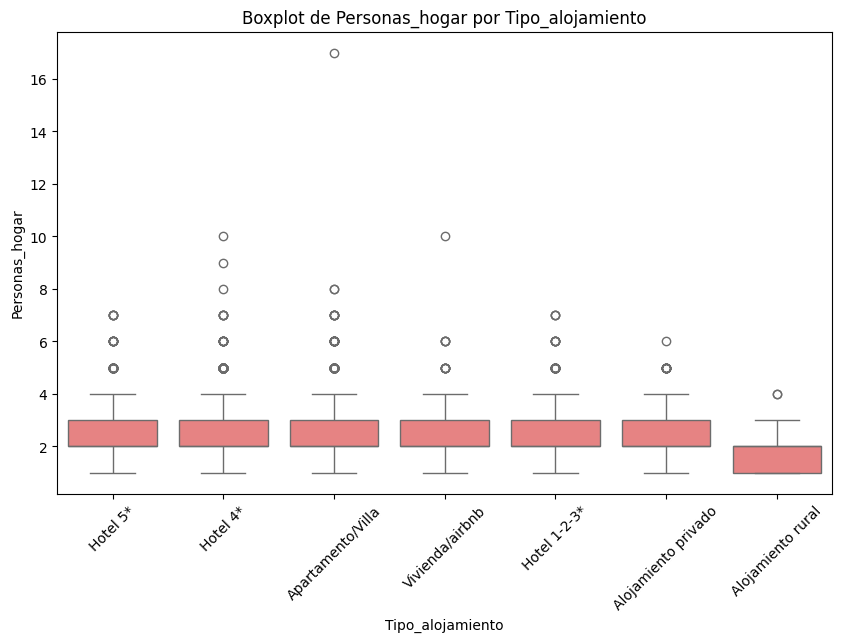

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (5) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


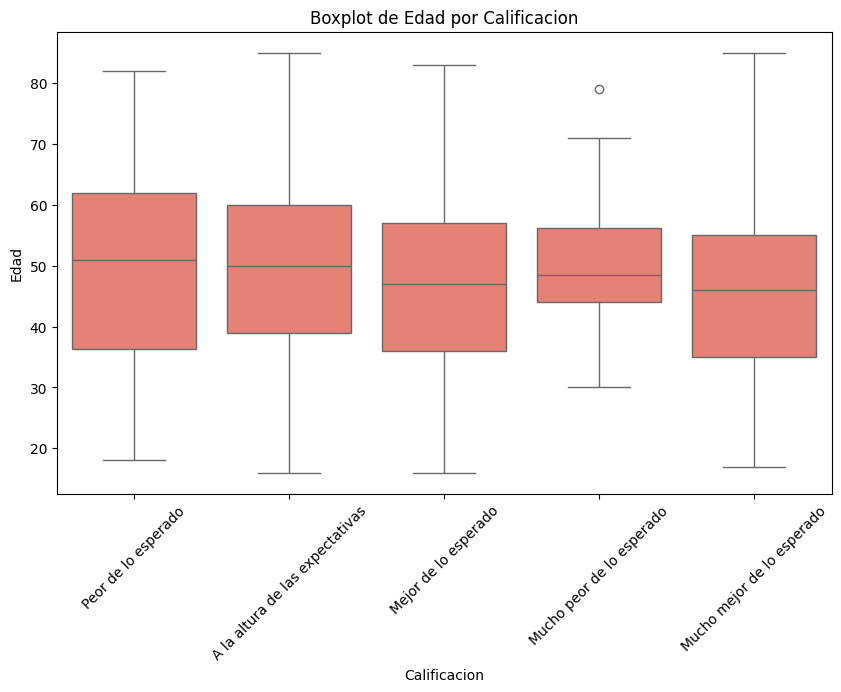

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (5) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


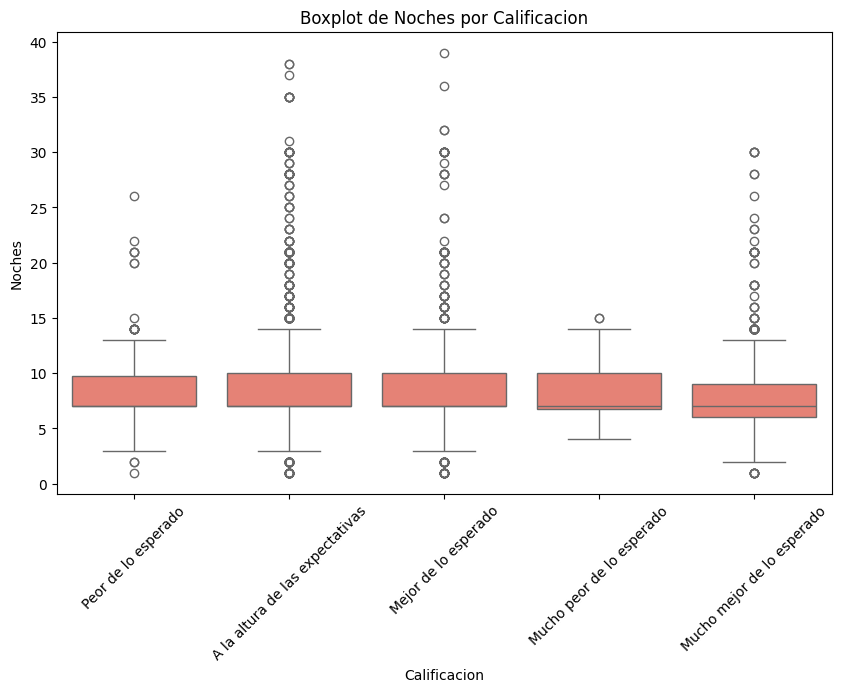

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (5) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


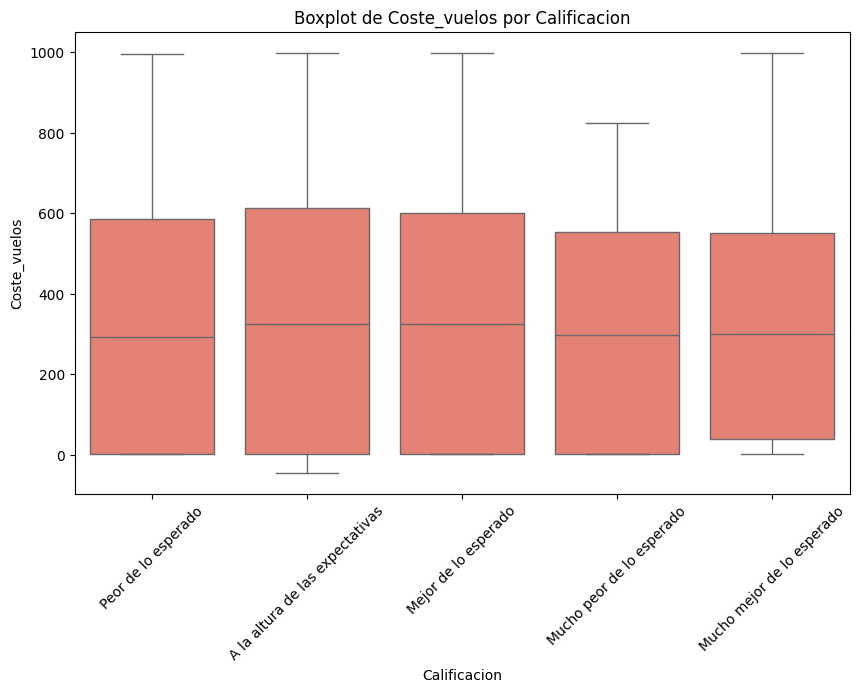

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (5) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


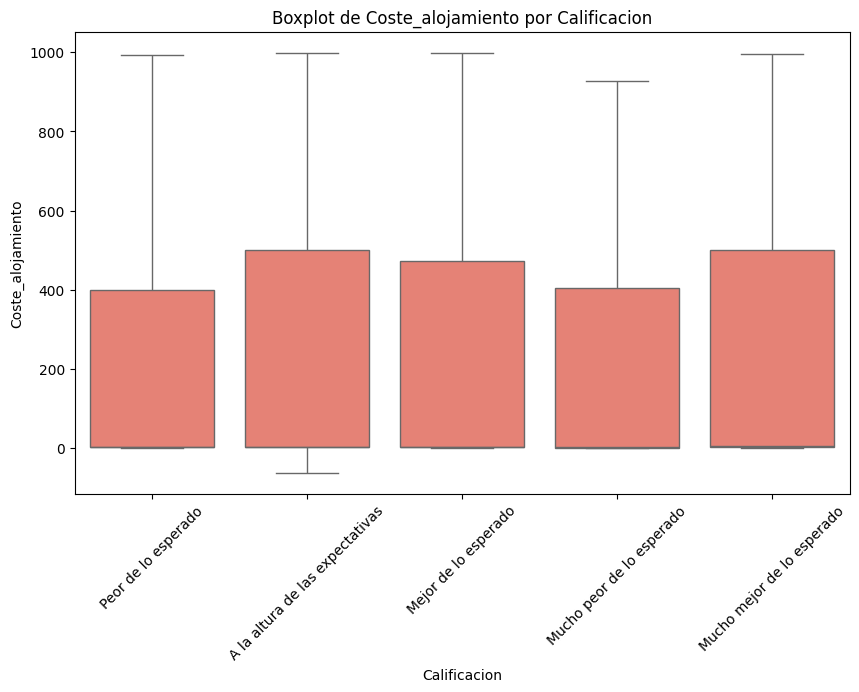

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (5) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


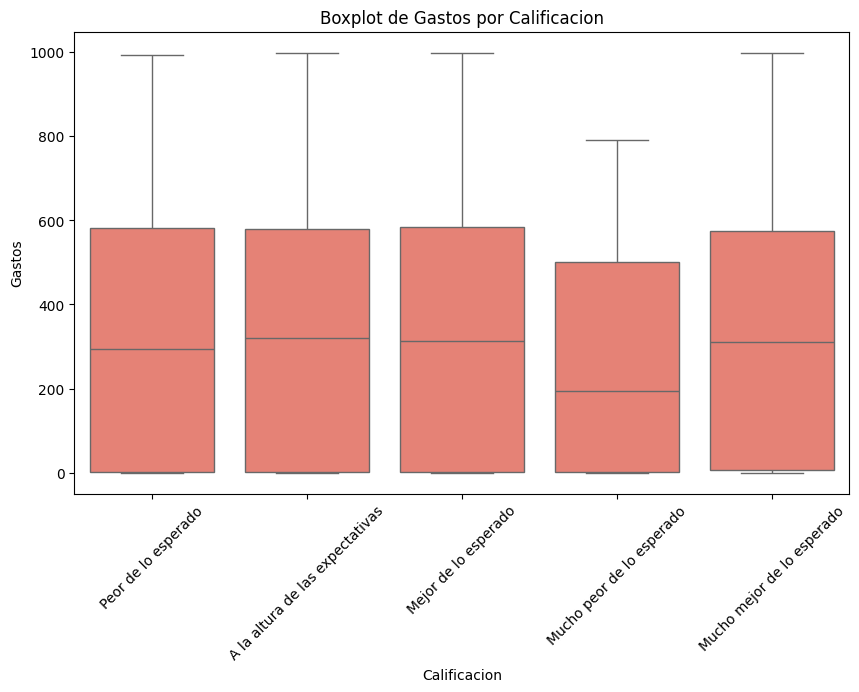

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (5) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


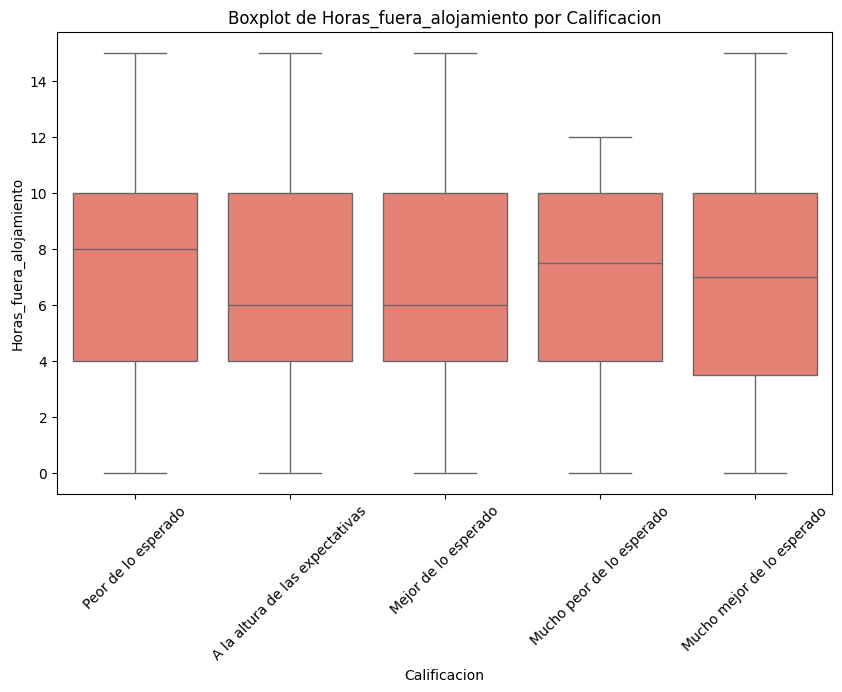

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (5) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


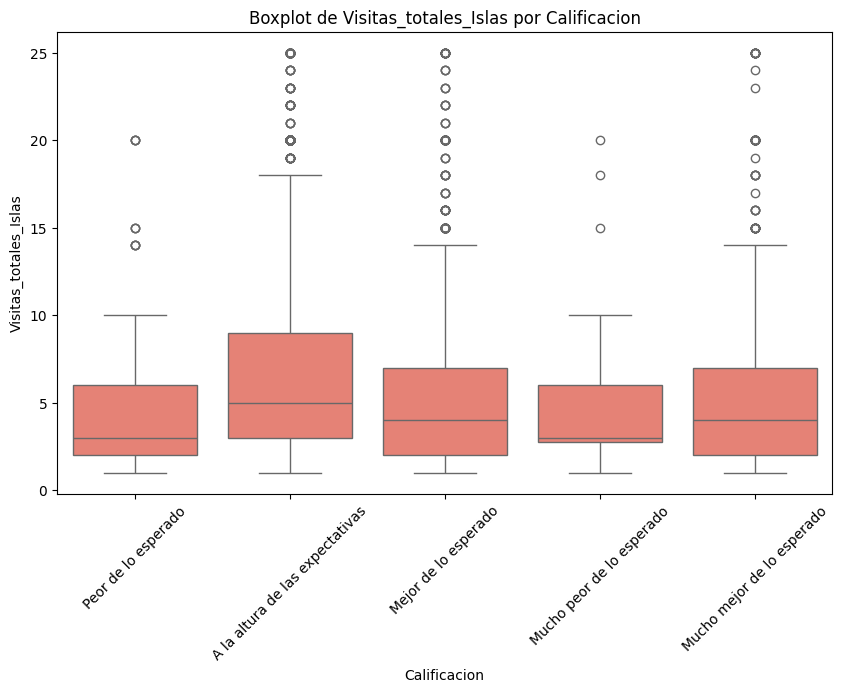

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (5) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


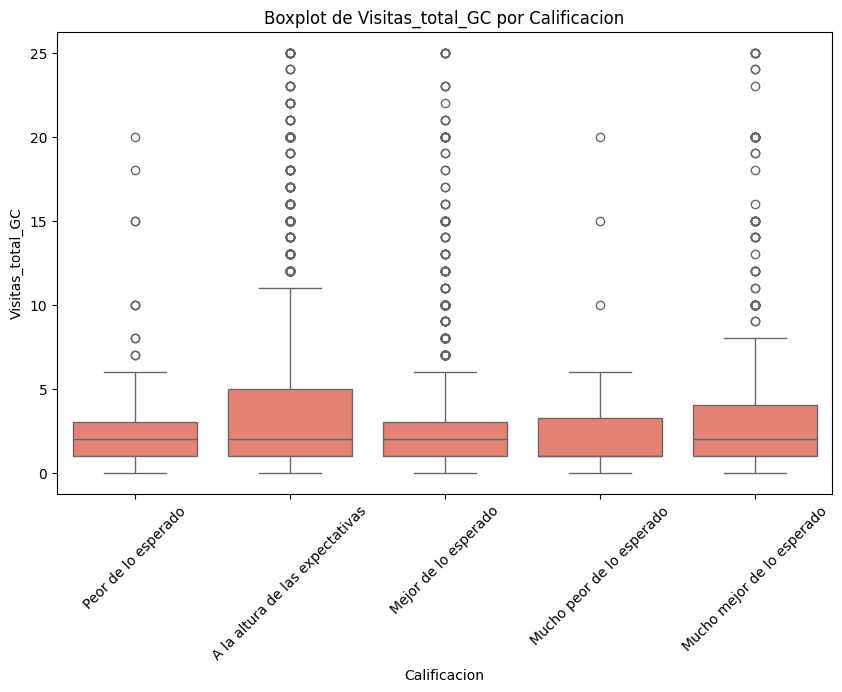

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (5) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


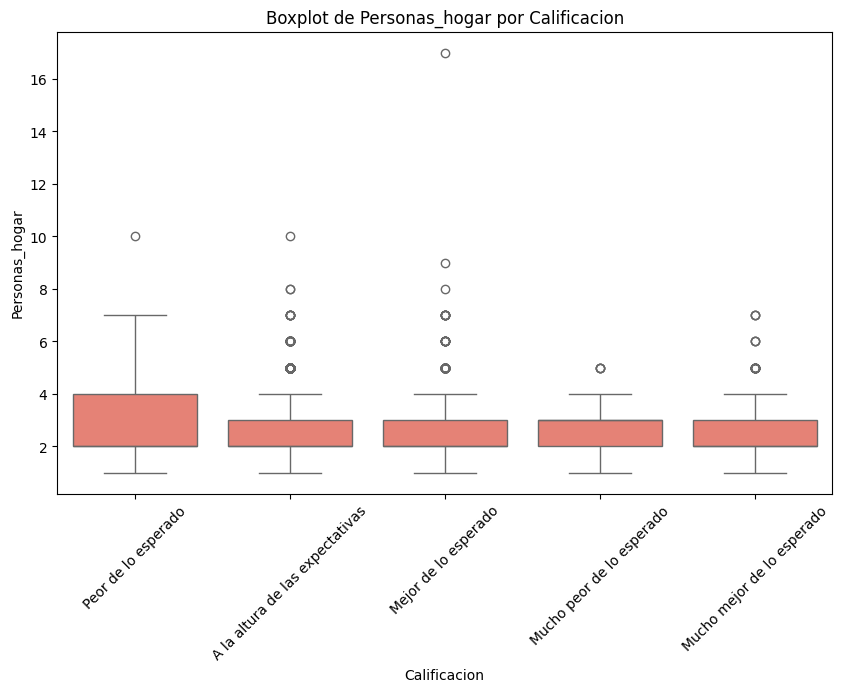

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (11) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


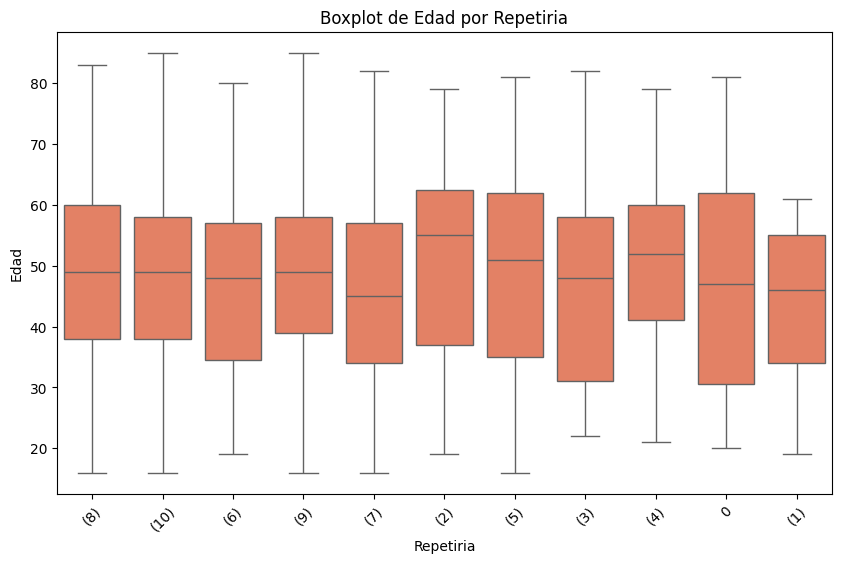

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (11) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


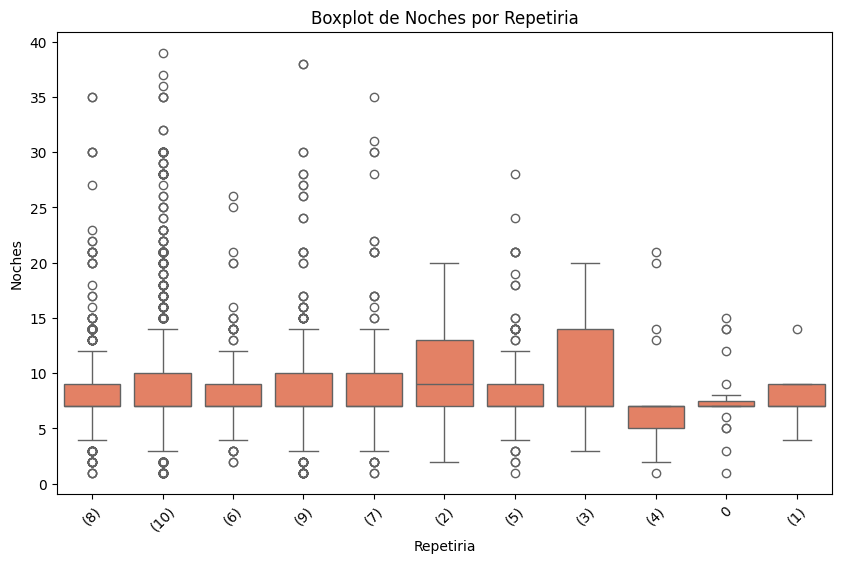

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (11) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


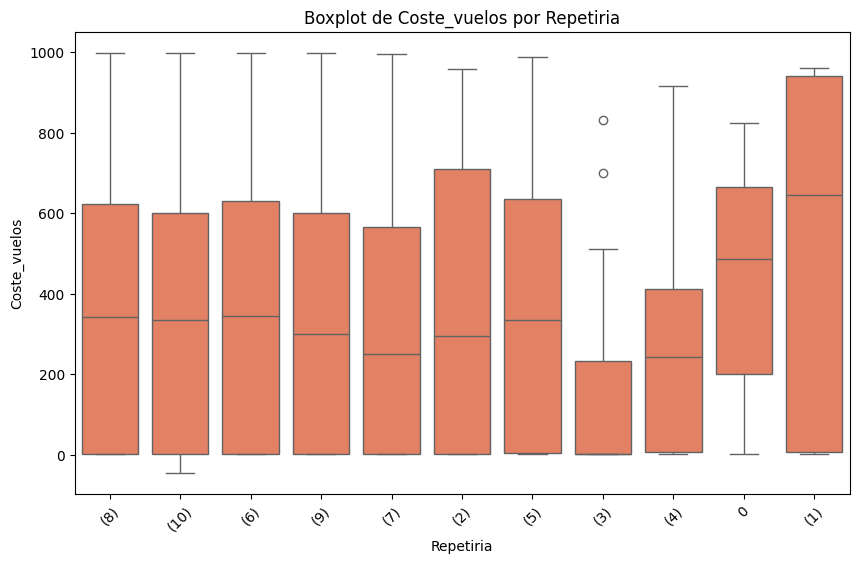

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (11) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


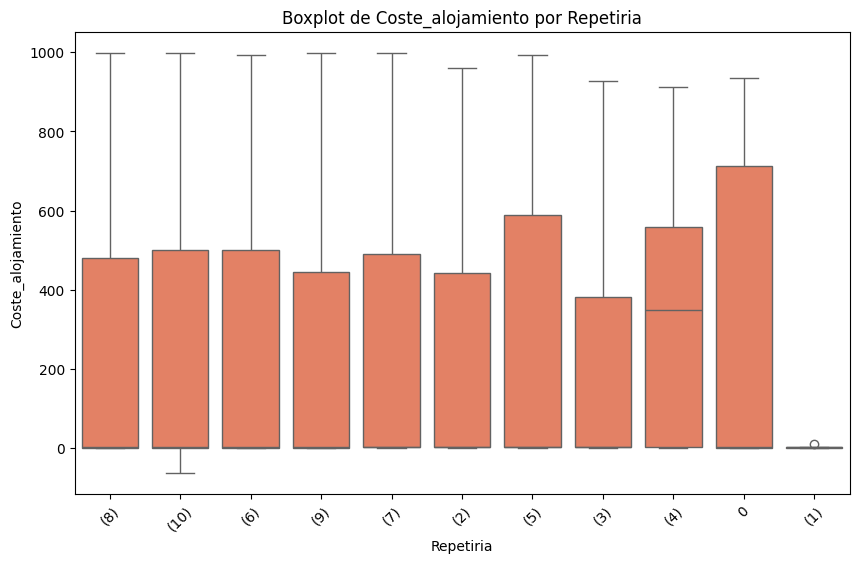

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (11) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


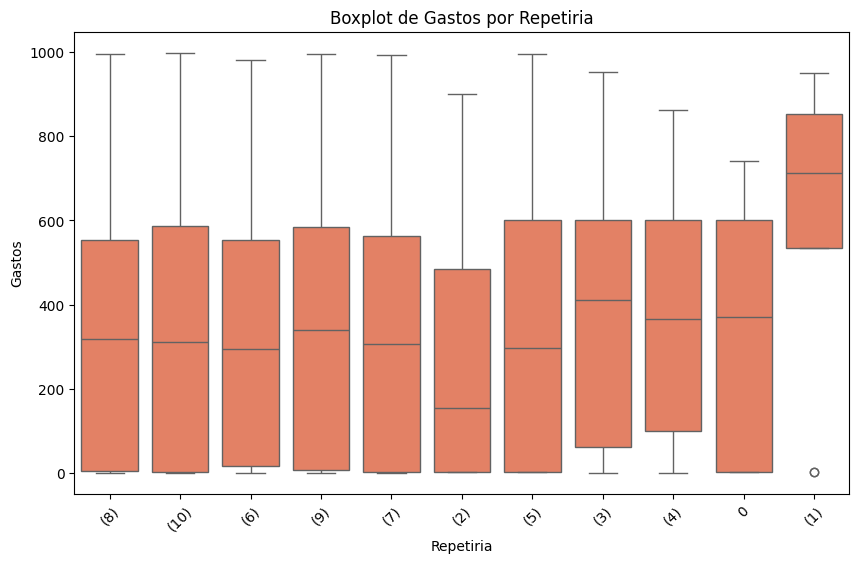

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (11) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


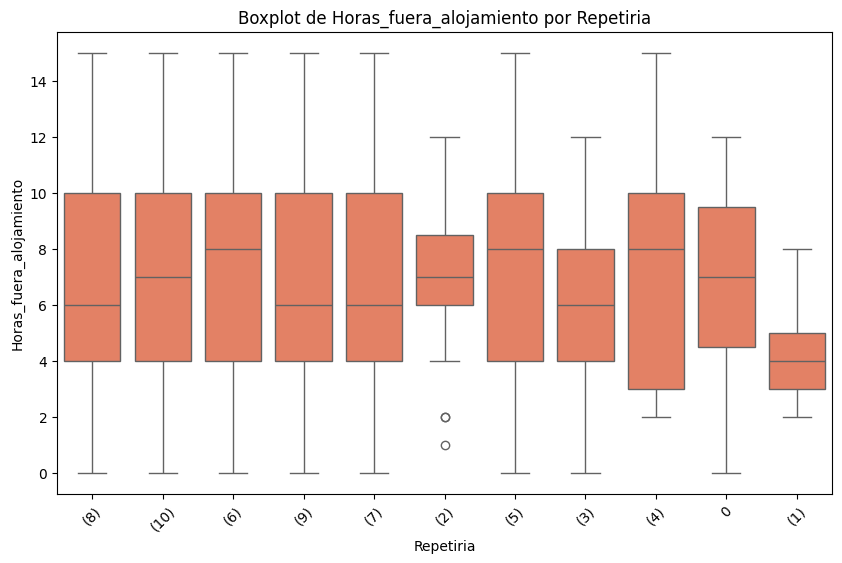

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (11) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


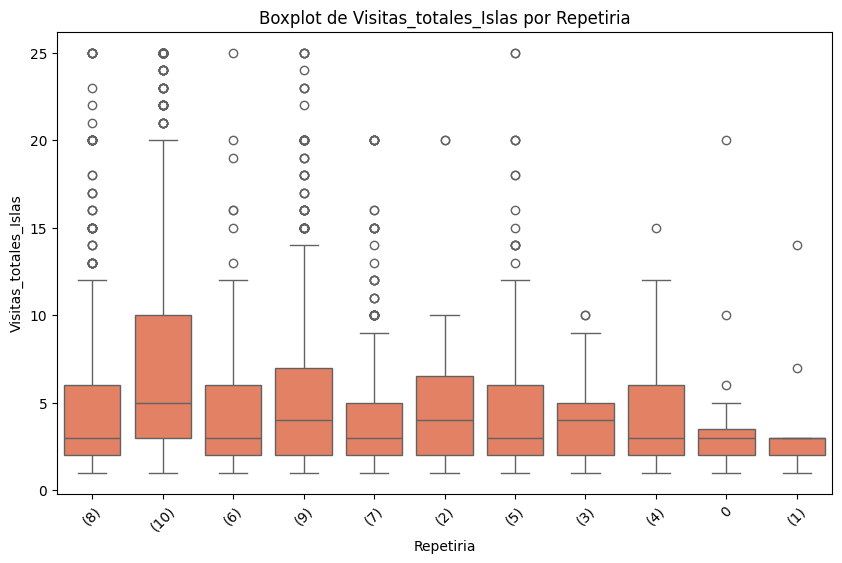

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (11) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


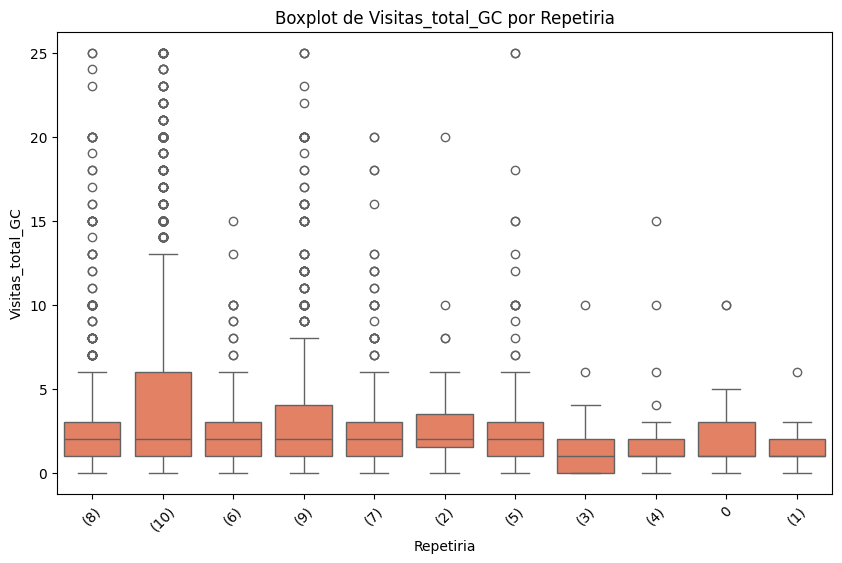

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (11) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


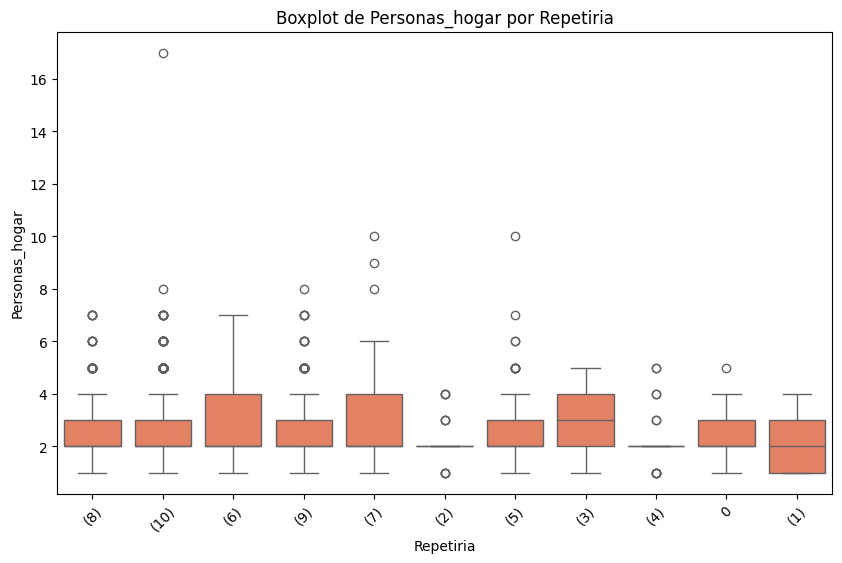

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (4) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


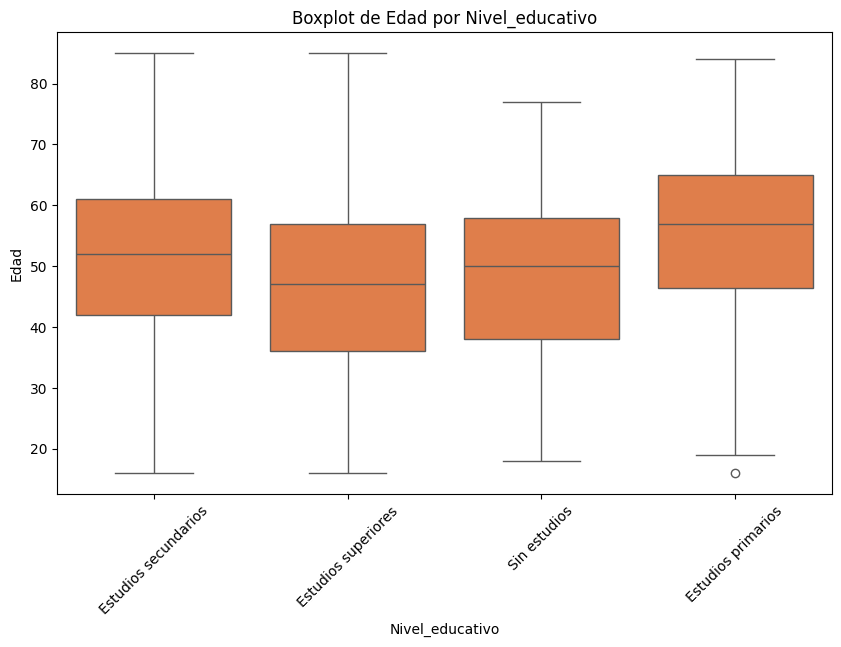

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (4) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


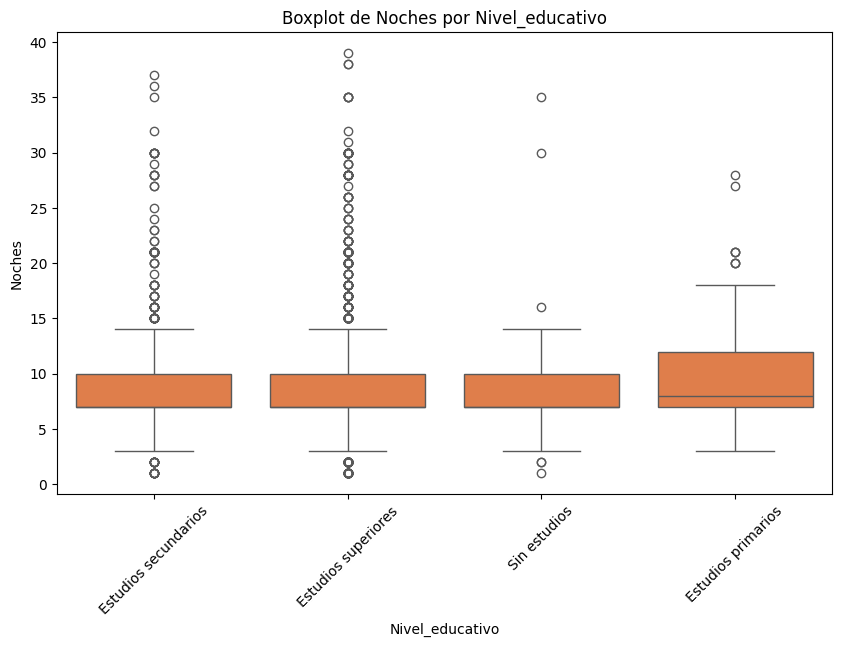

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (4) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


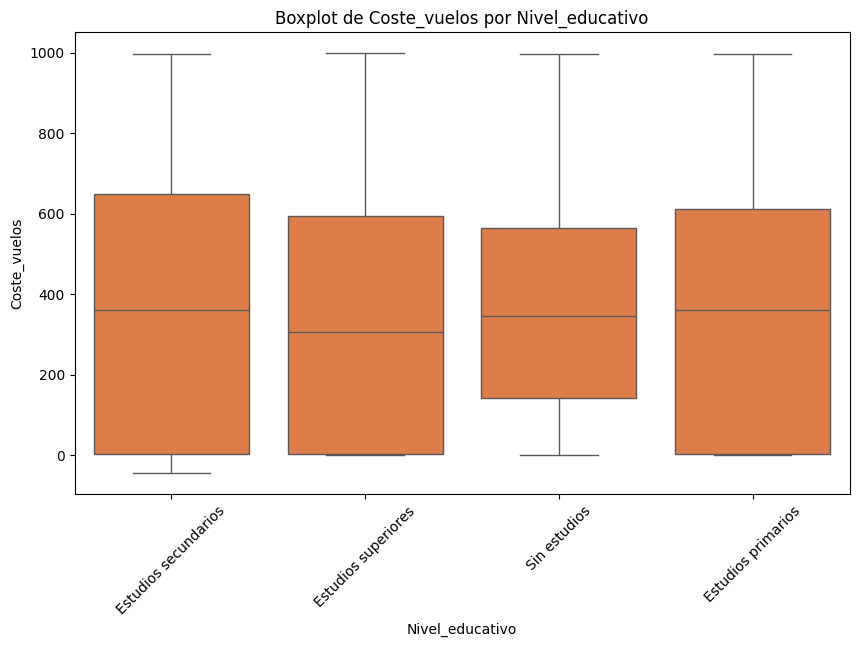

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (4) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


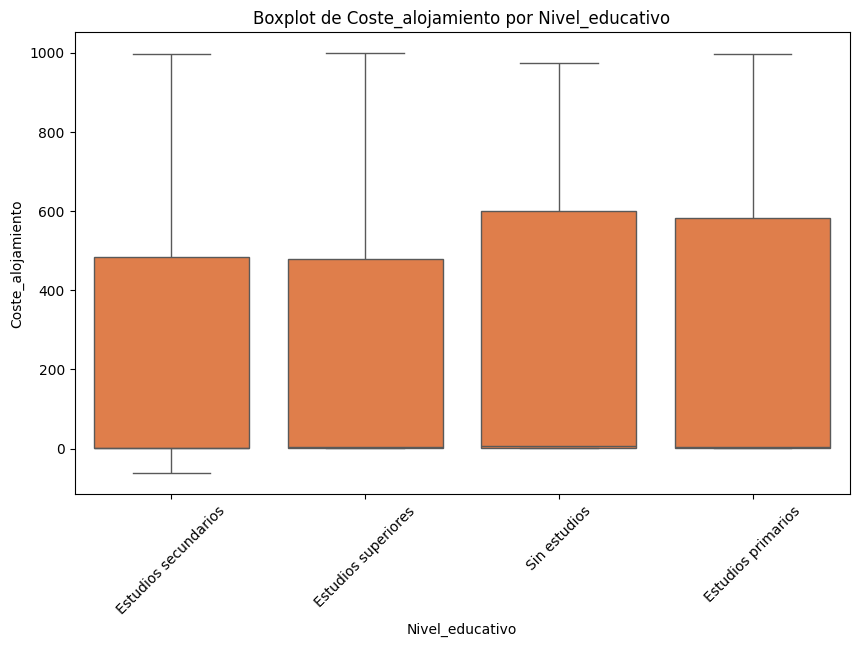

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (4) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


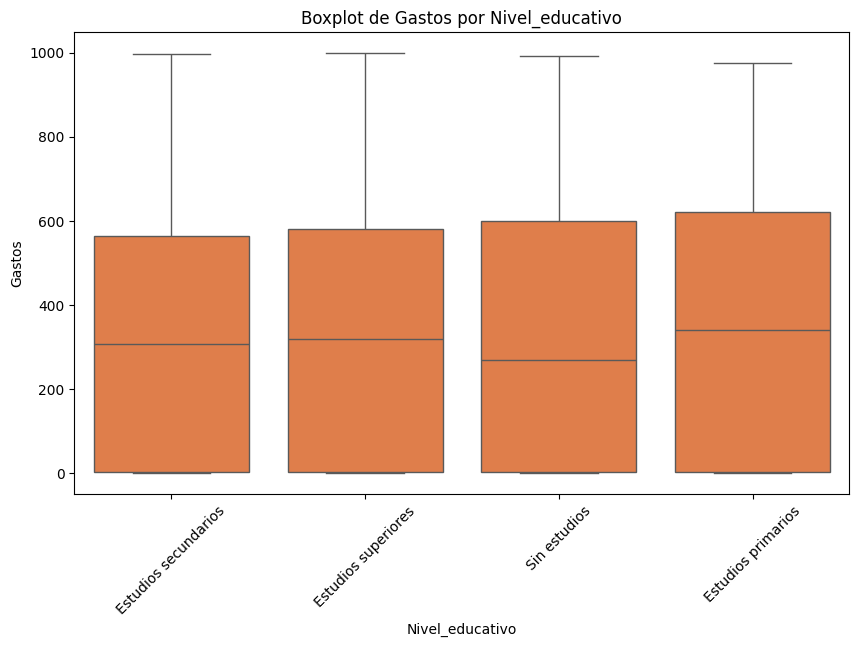

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (4) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


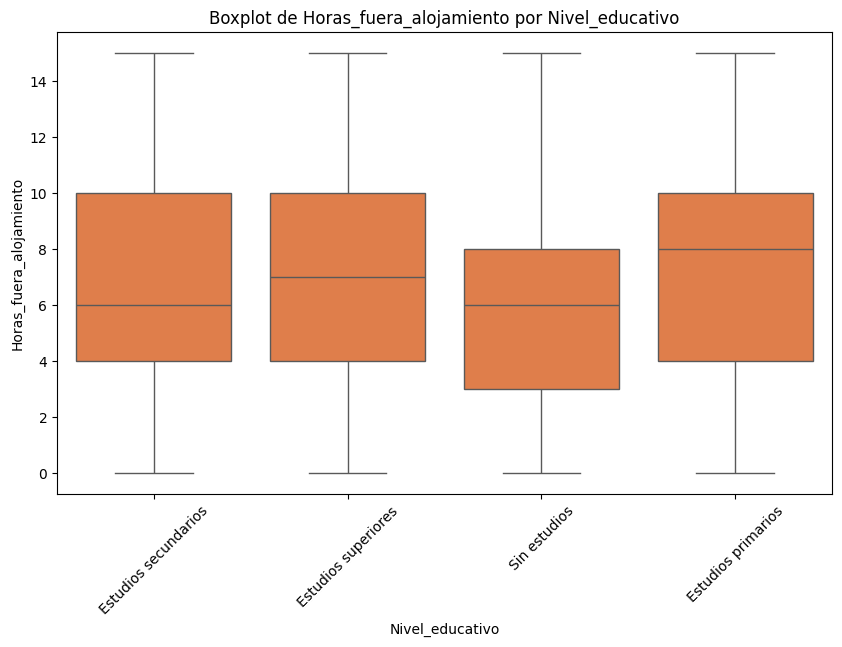

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (4) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


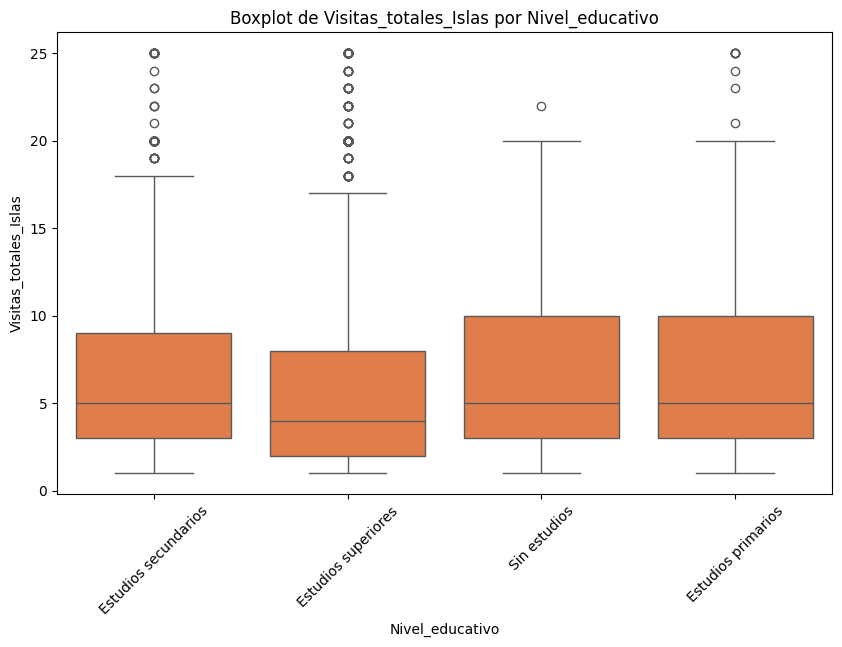

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (4) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


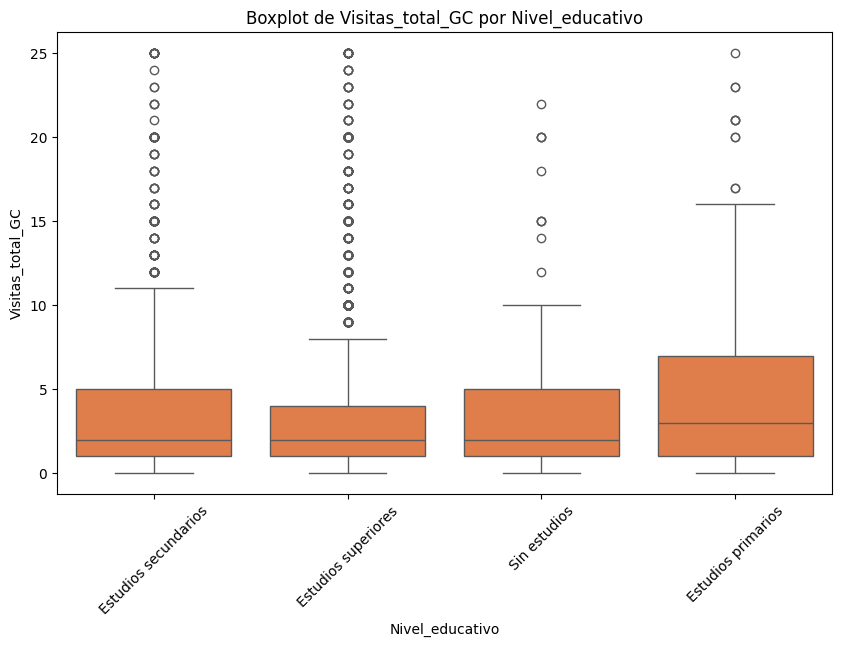

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (4) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


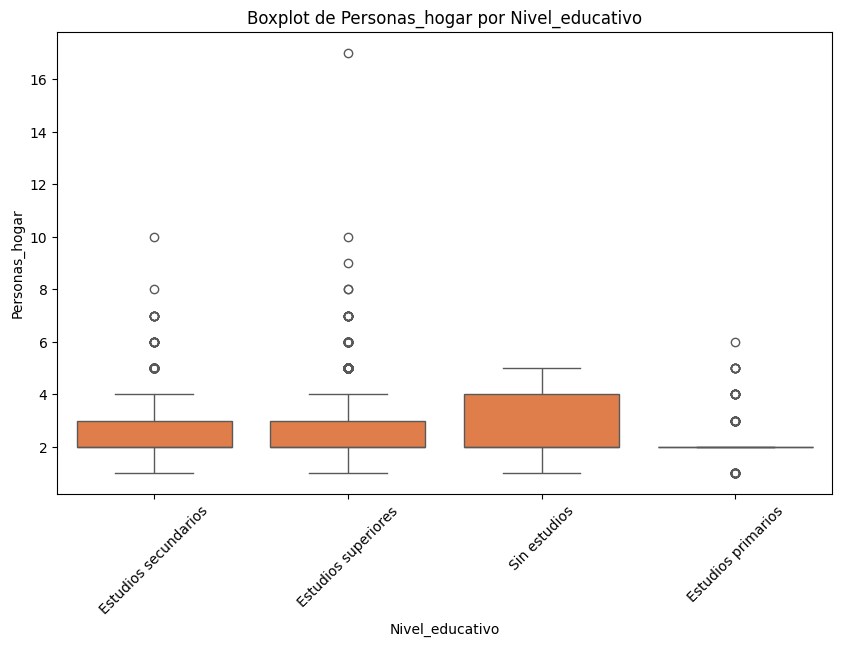

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (11) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


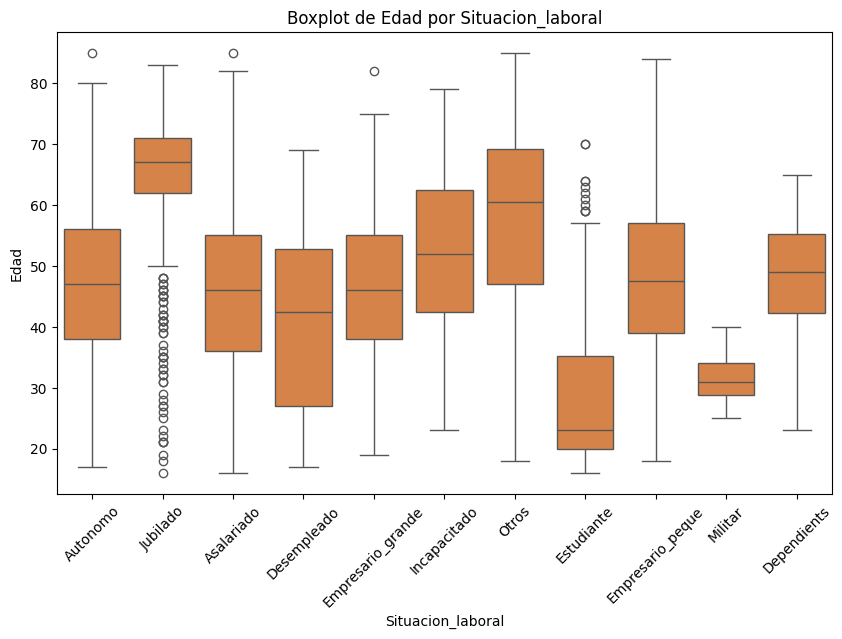

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (11) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


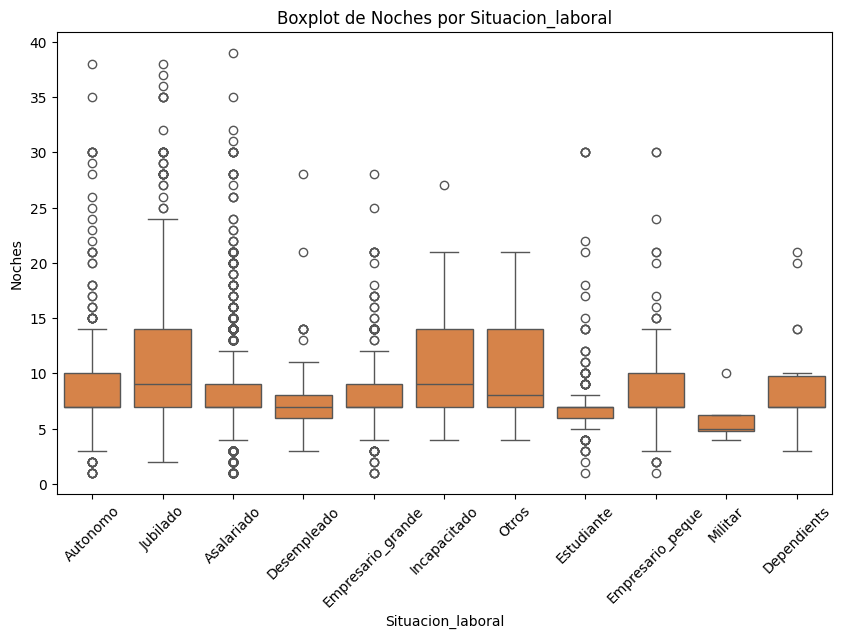

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (11) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


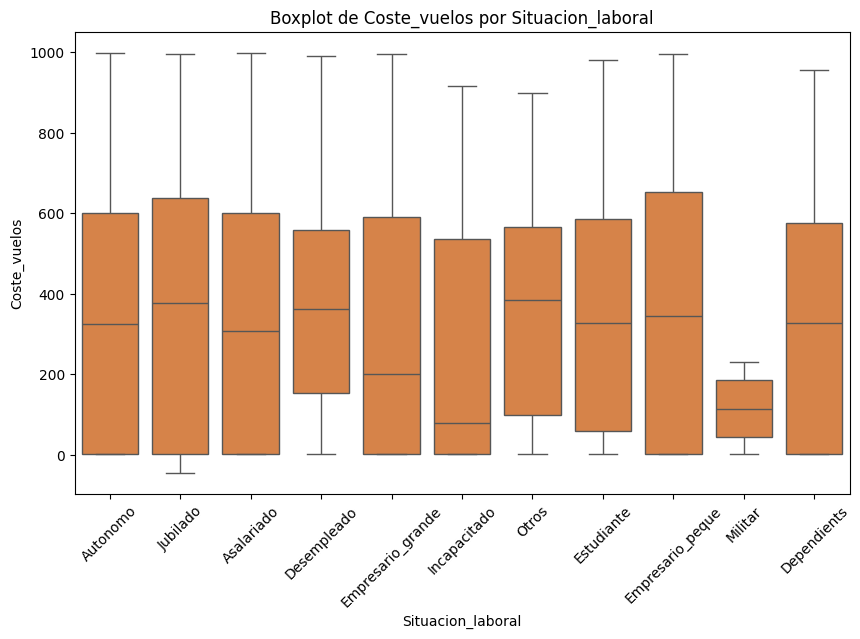

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (11) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


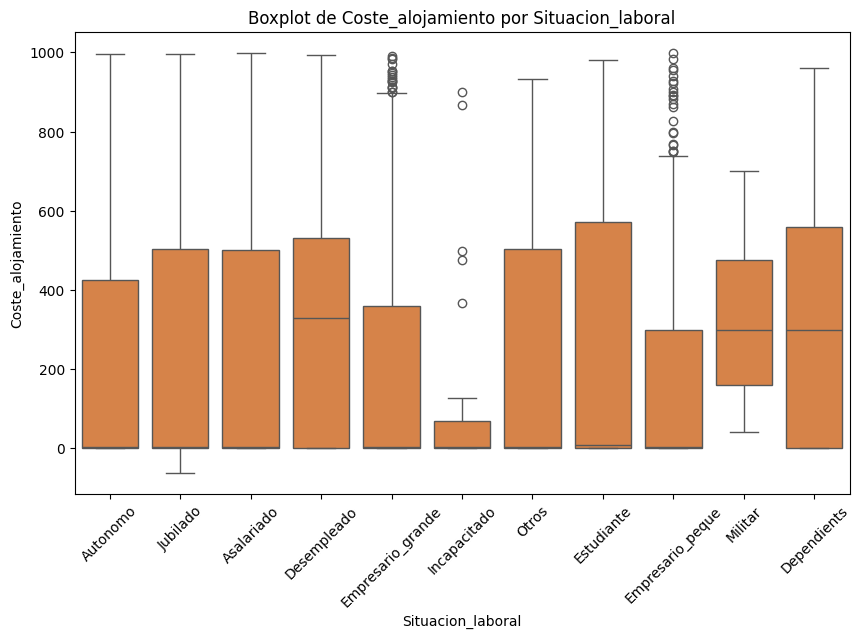

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (11) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


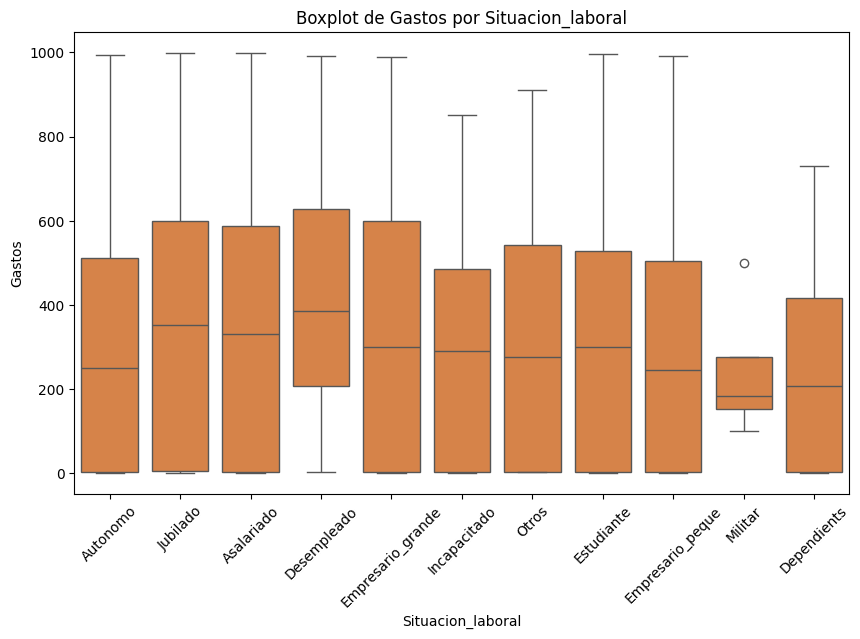

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (11) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


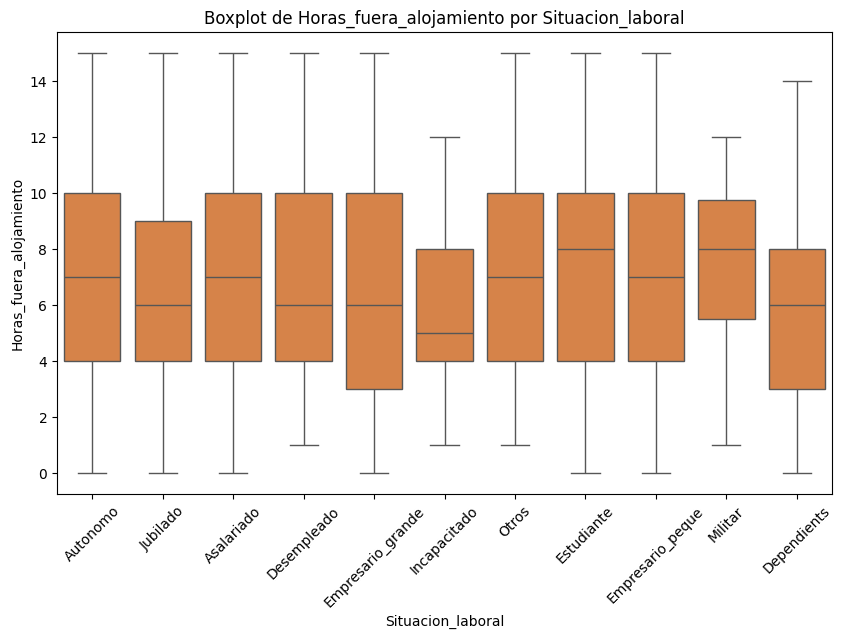

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (11) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


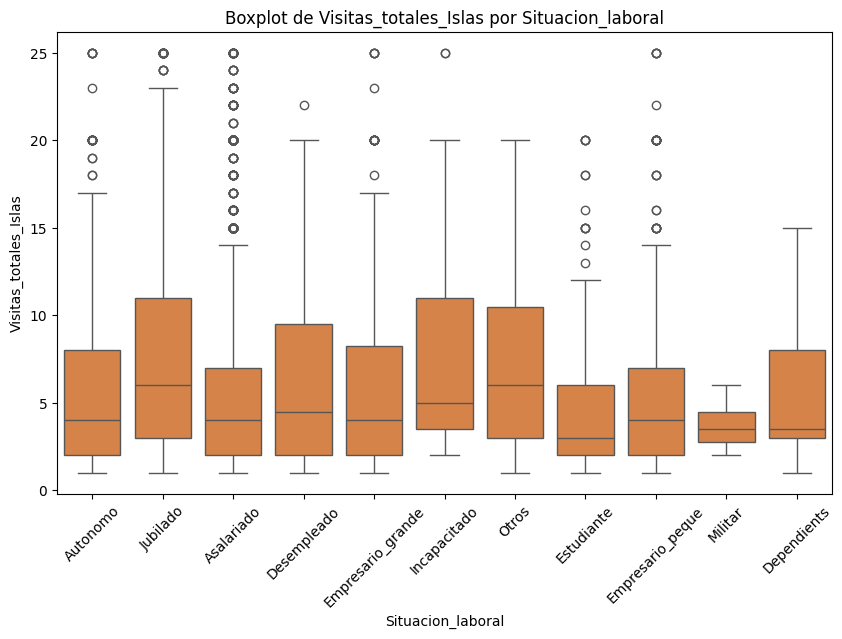

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (11) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


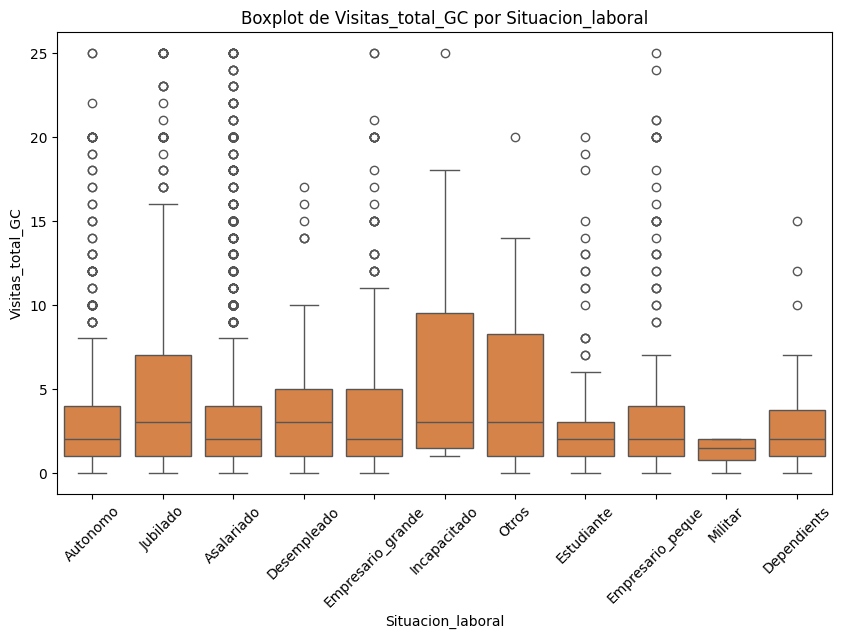

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (11) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


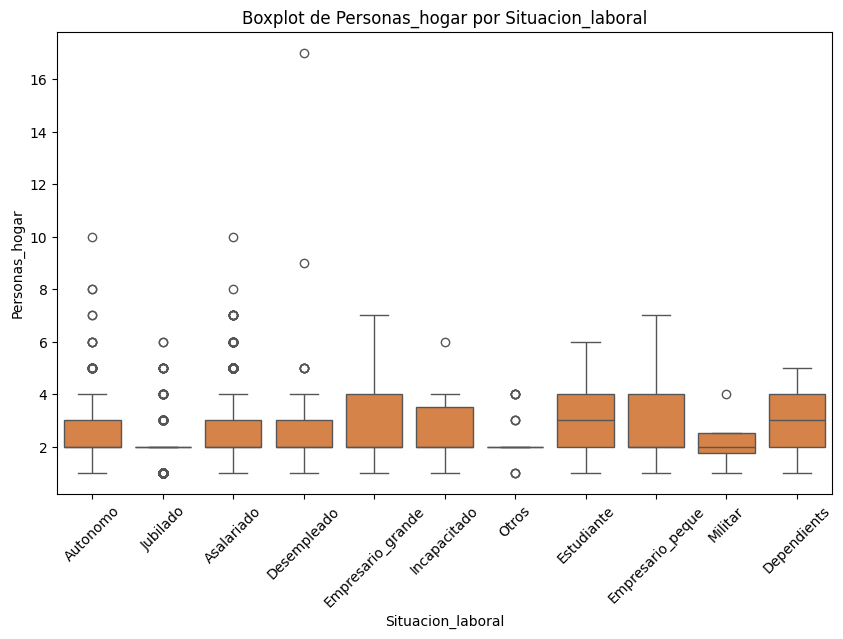

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (4) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


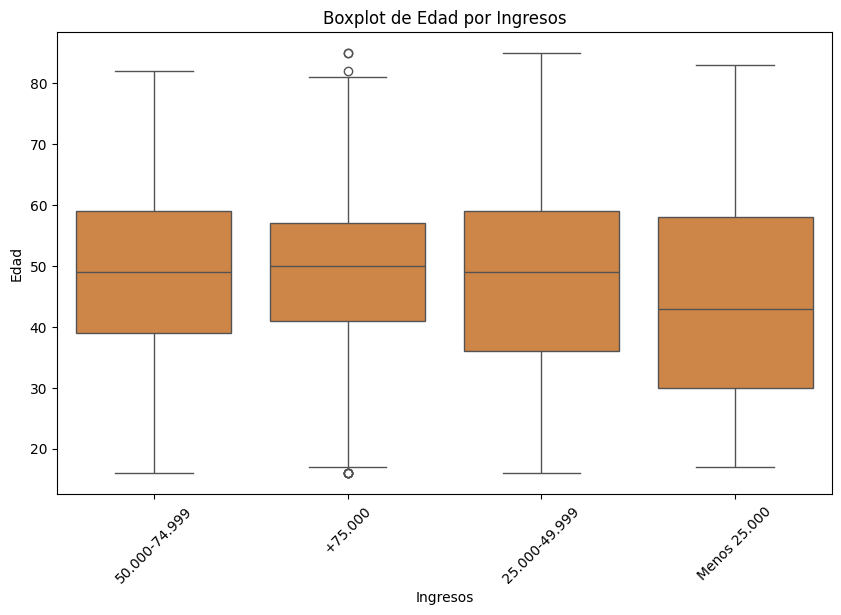

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (4) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


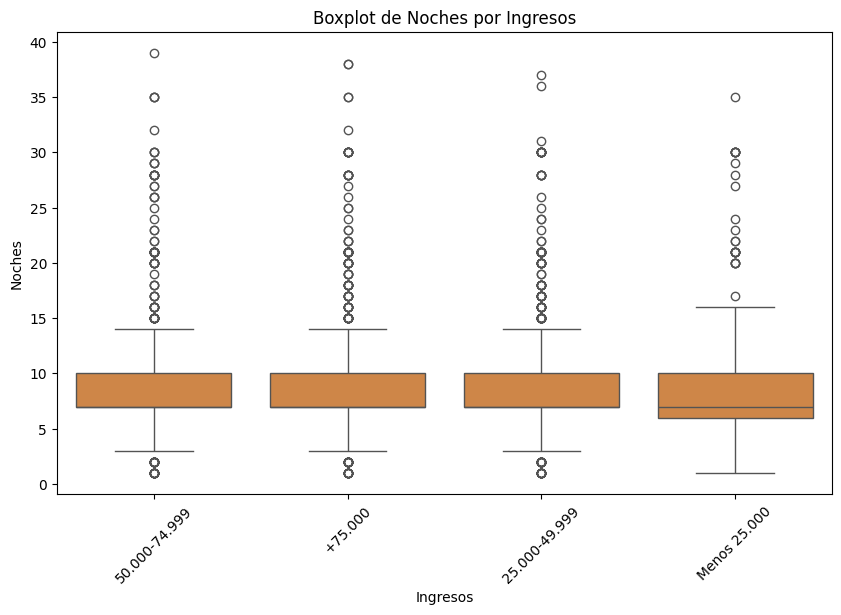

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (4) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


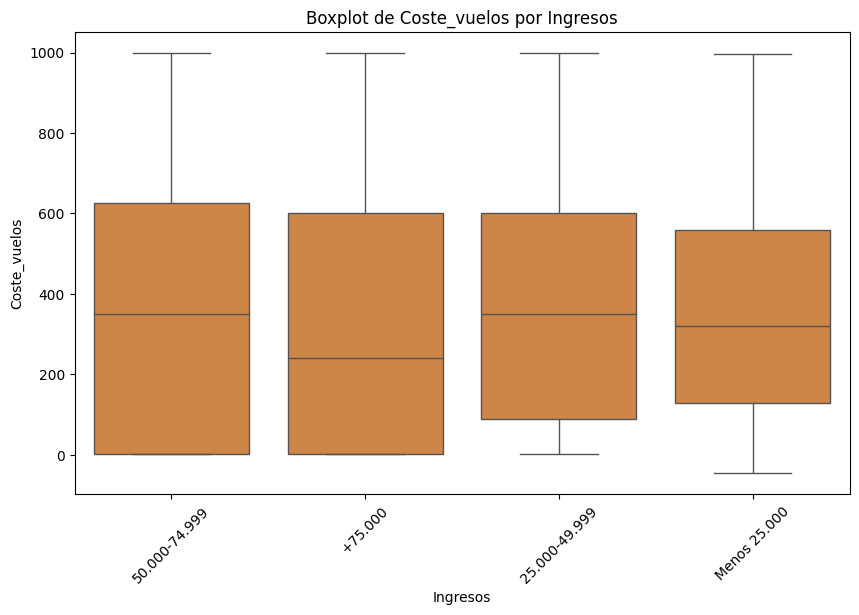

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (4) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


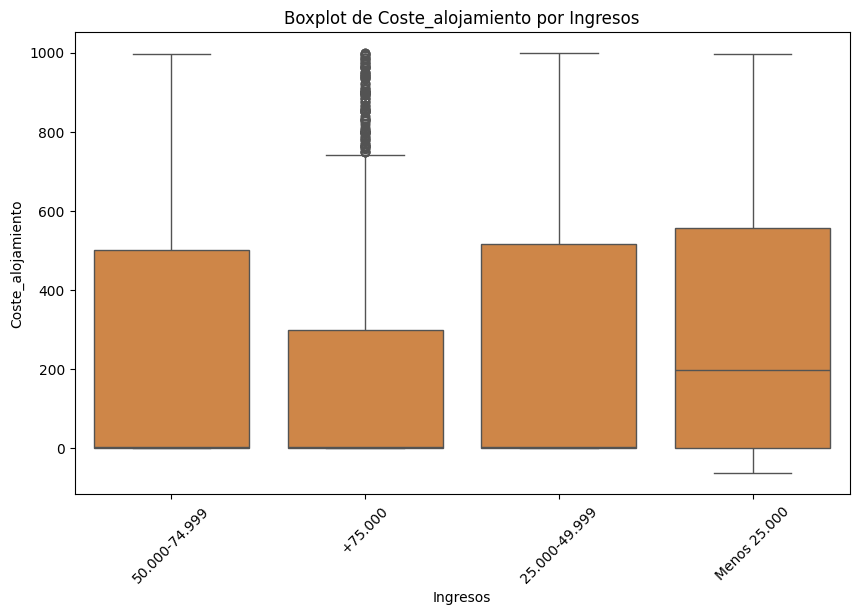

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (4) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


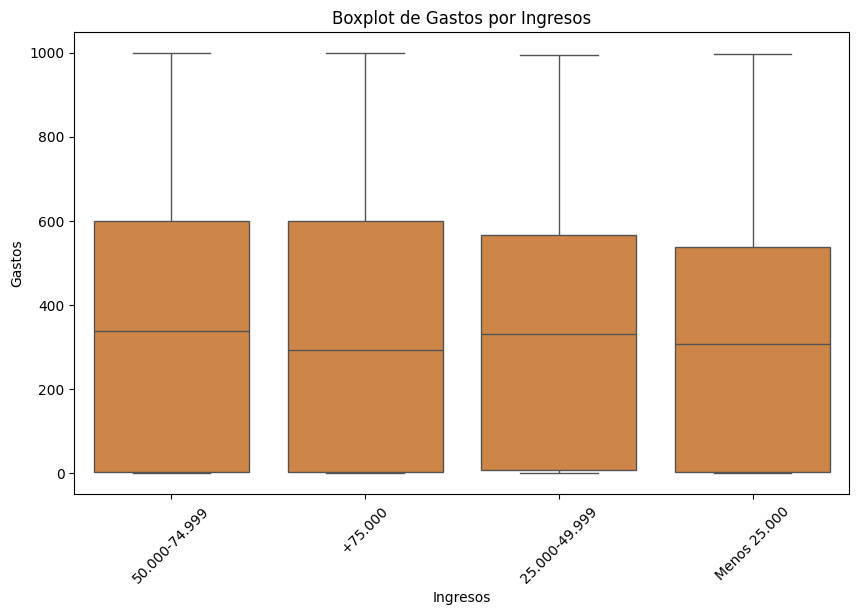

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (4) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


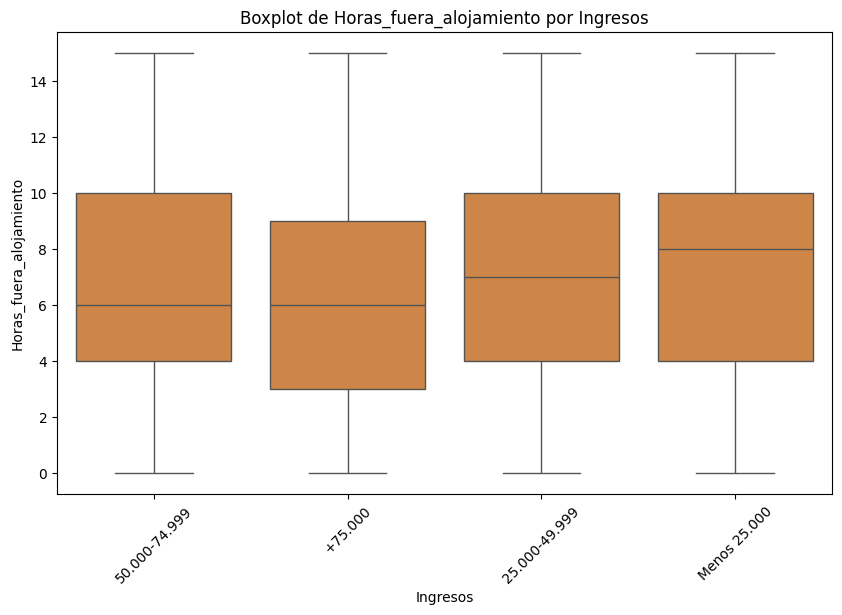

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (4) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


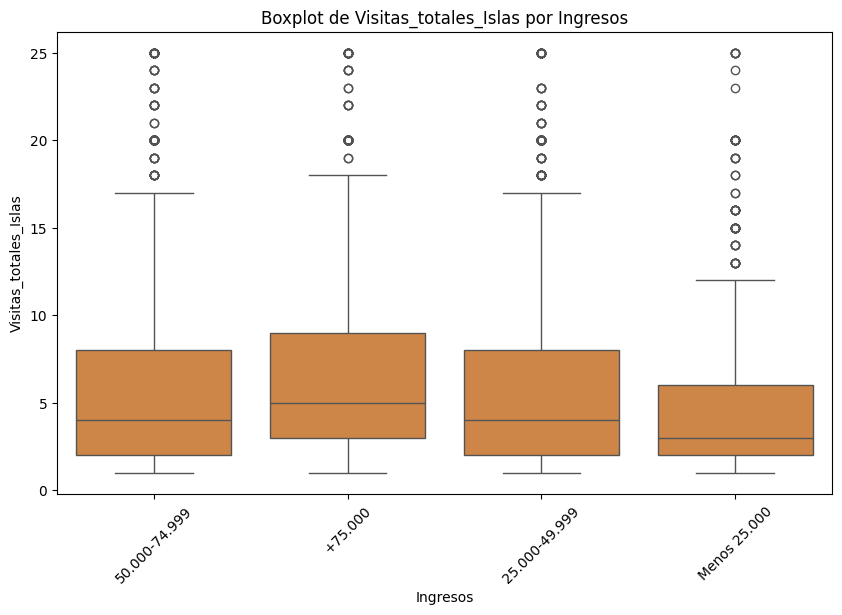

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (4) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


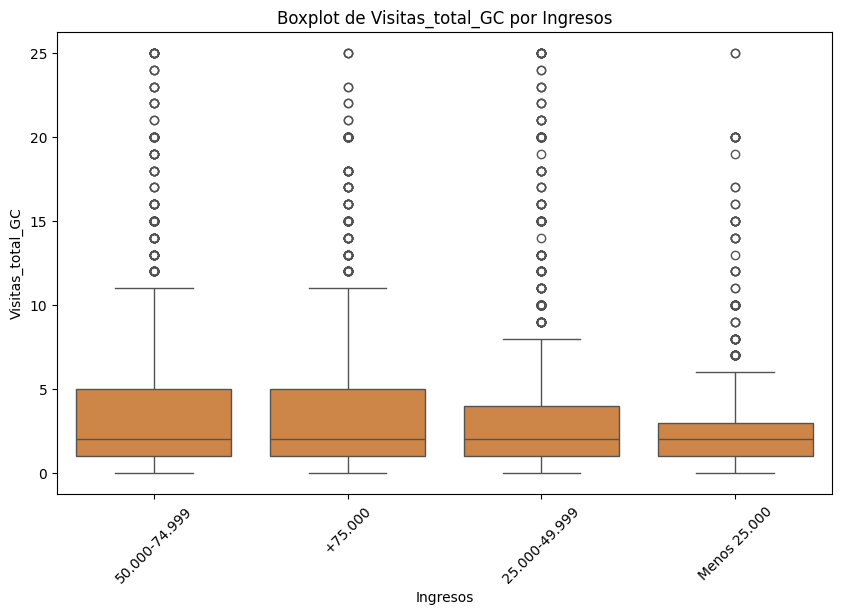

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (4) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


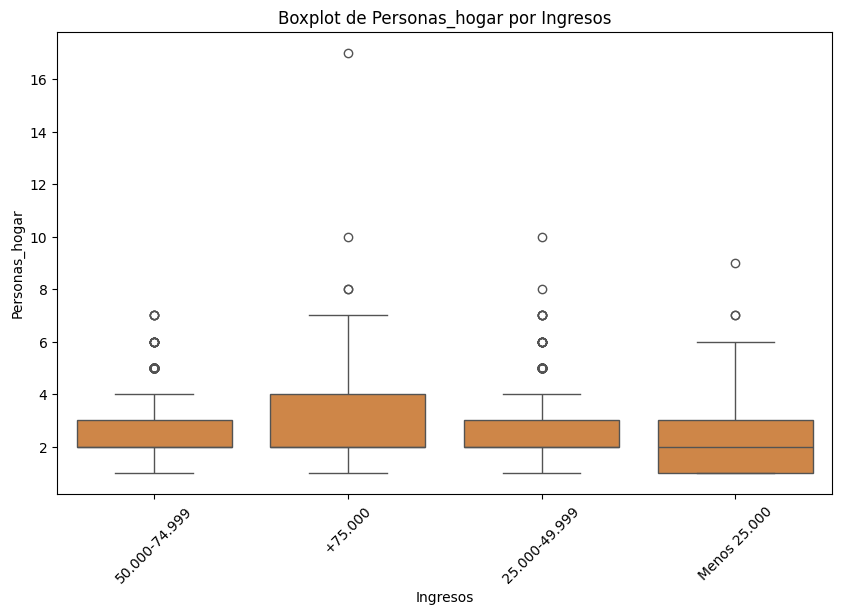

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (5) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


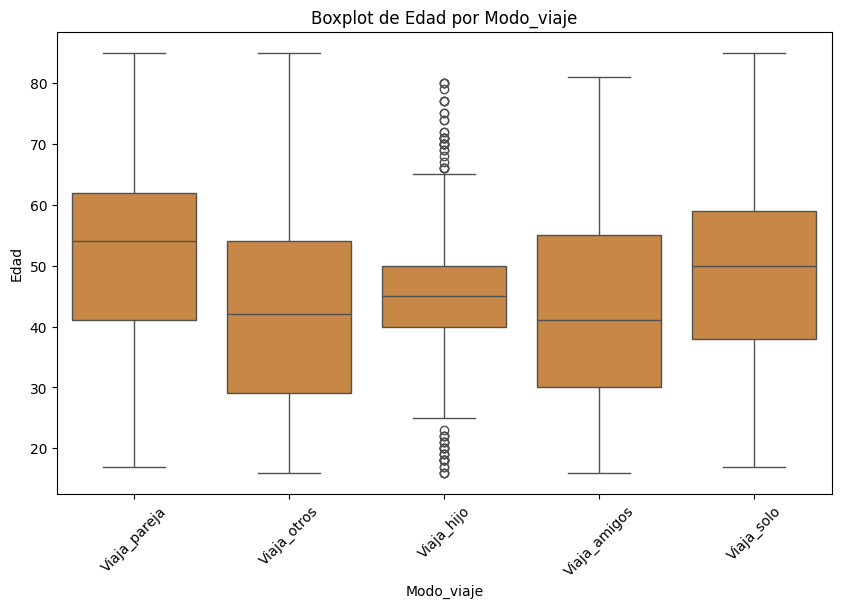

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (5) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


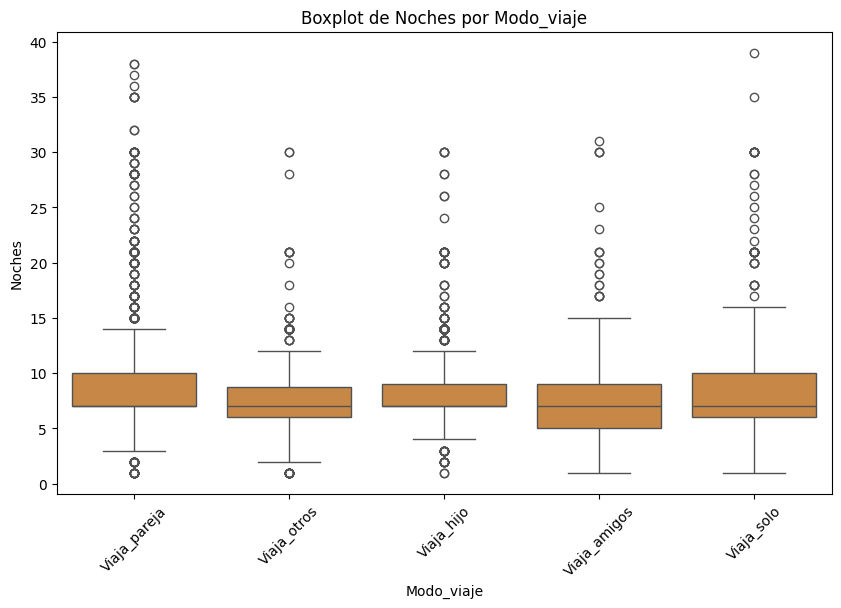

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (5) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


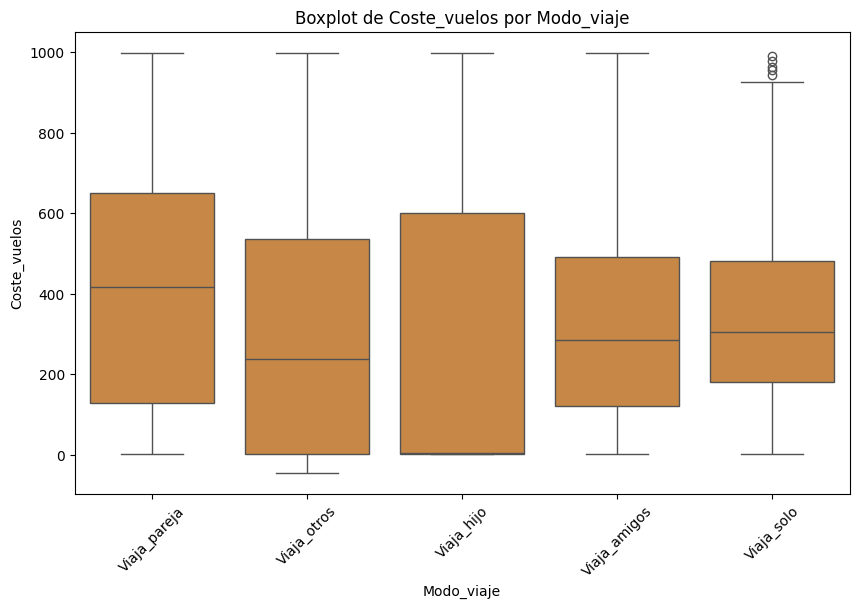

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (5) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


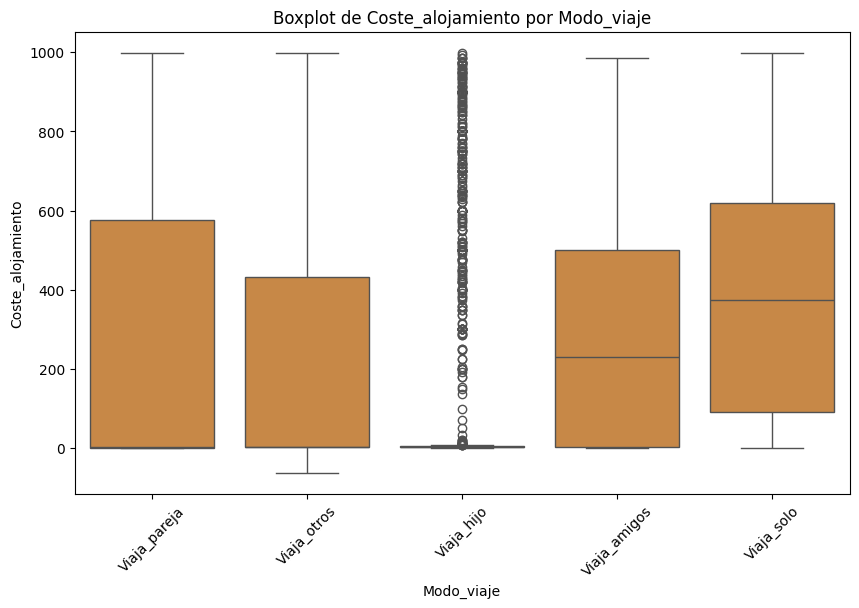

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (5) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


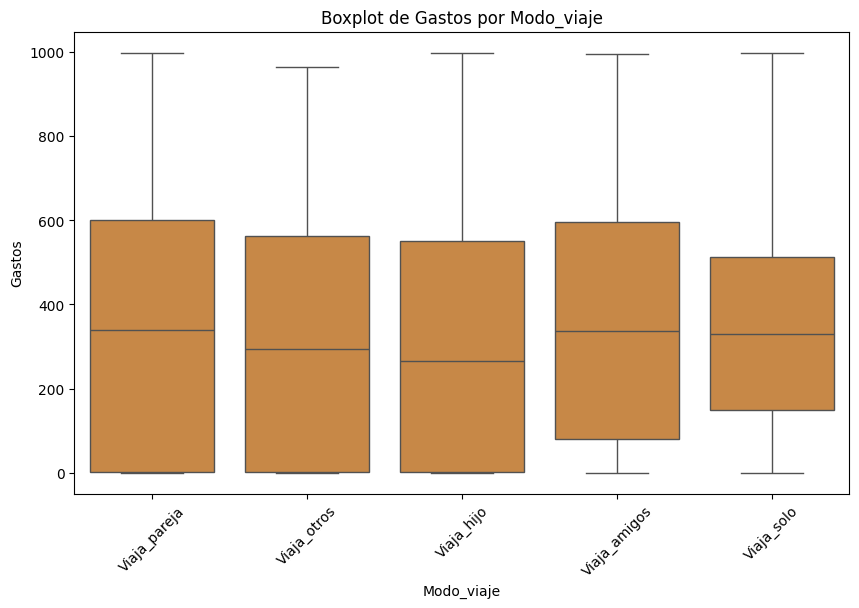

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (5) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


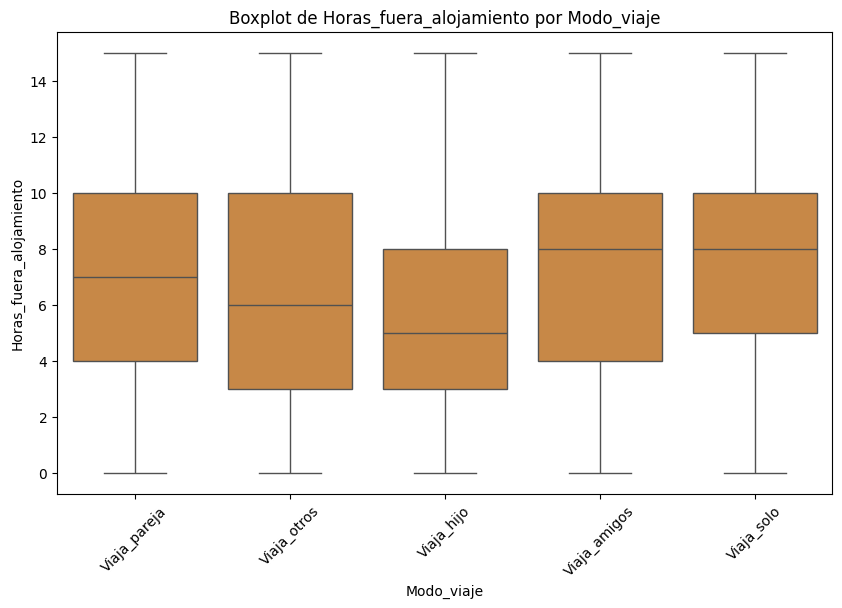

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (5) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


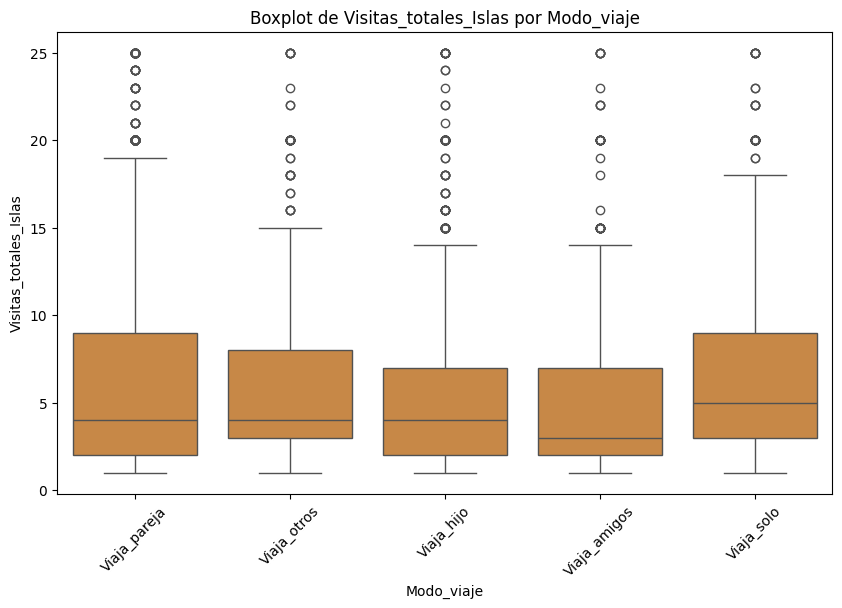

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (5) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


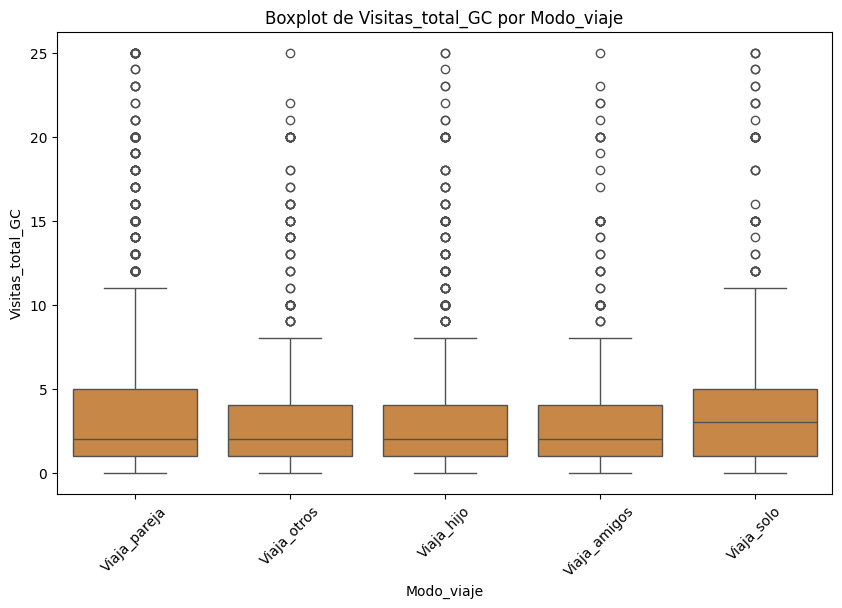

c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])
c:\Users\Carol\Documents\GitHub\Datos_EDA\src\utils.py:382: UserWarning: 
The palette list has fewer values (1) than needed (5) and will cycle, which may produce an uninterpretable plot.
  sns.boxplot(x=df[cat_col], y=df[num_col], palette=[colors[color_idx]])


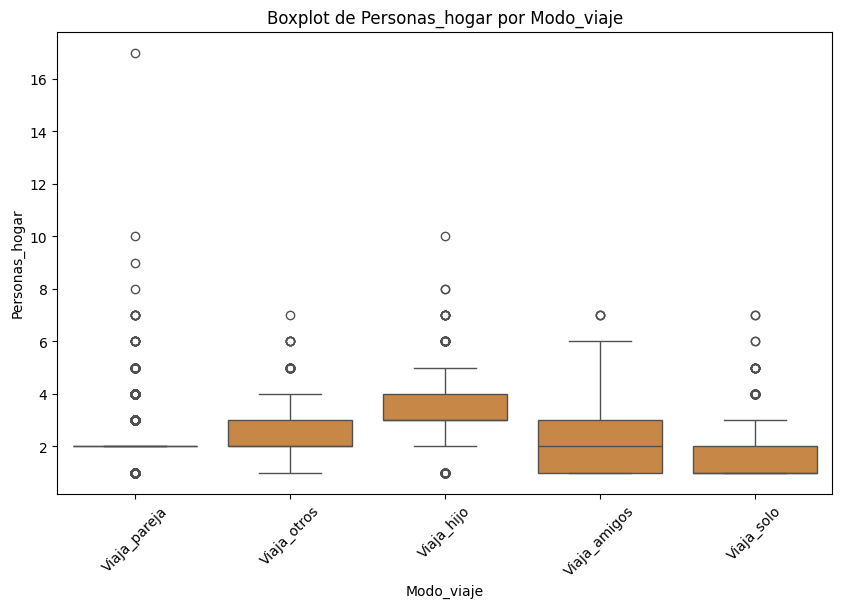

In [3]:
# Llamar a la función con los datos y columnas correspondientes
plot_categorical_numerical_boxplots(df_2022, variables_categoricas, variables_numericas)

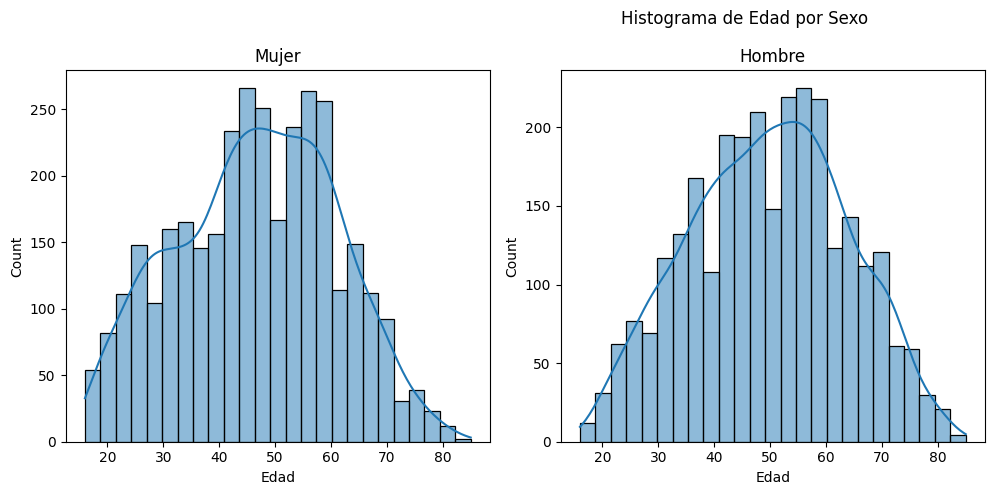

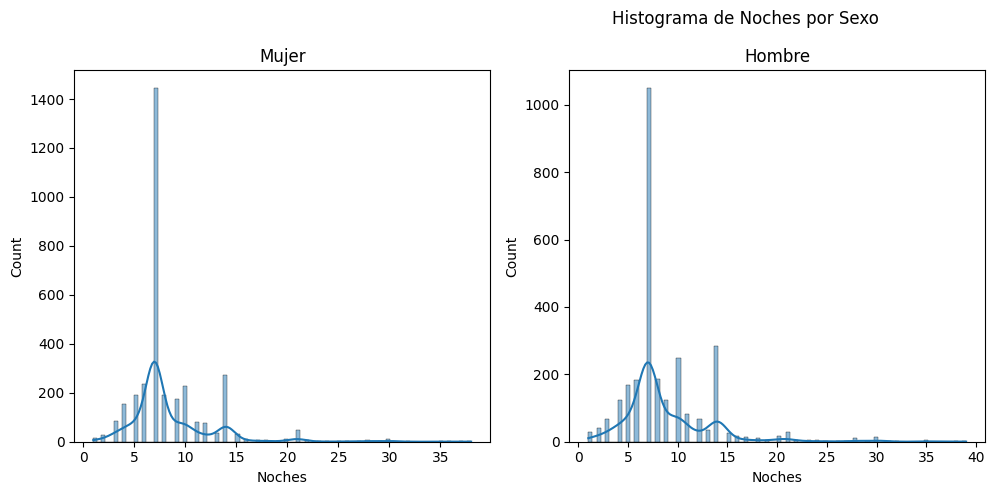

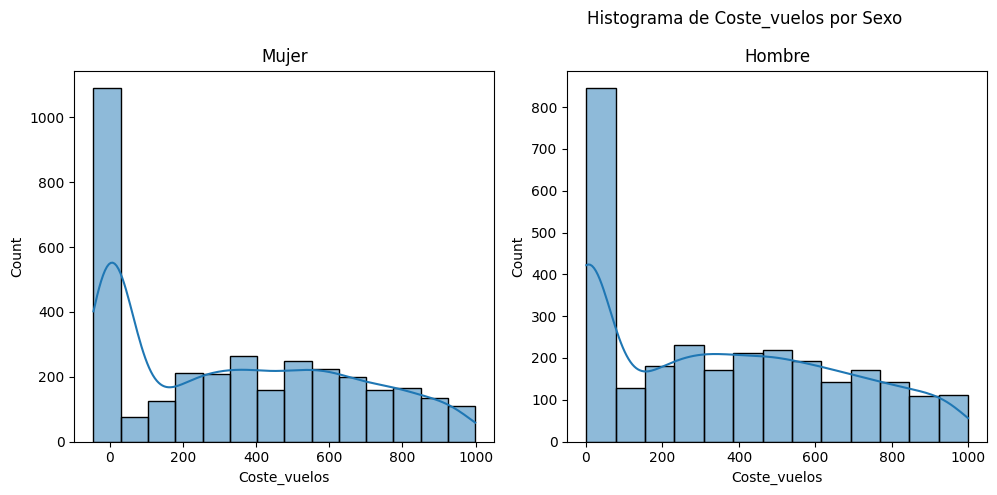

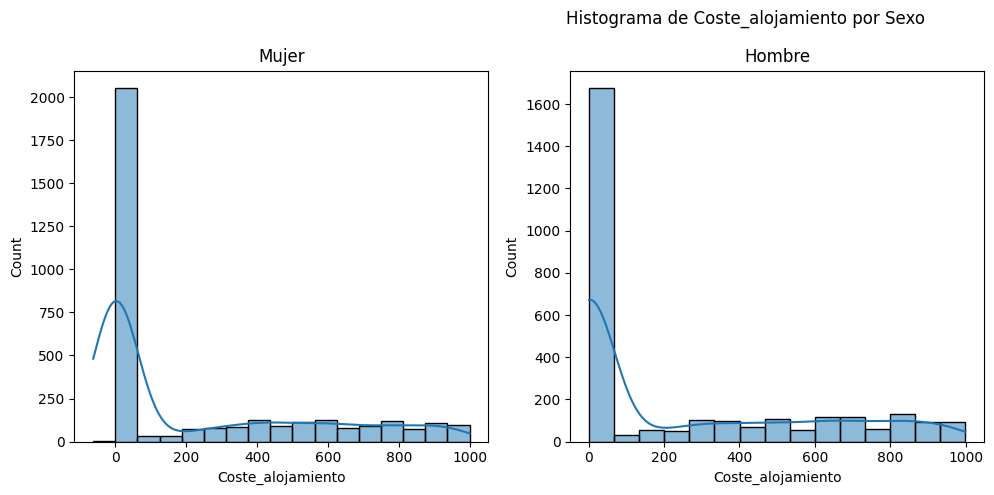

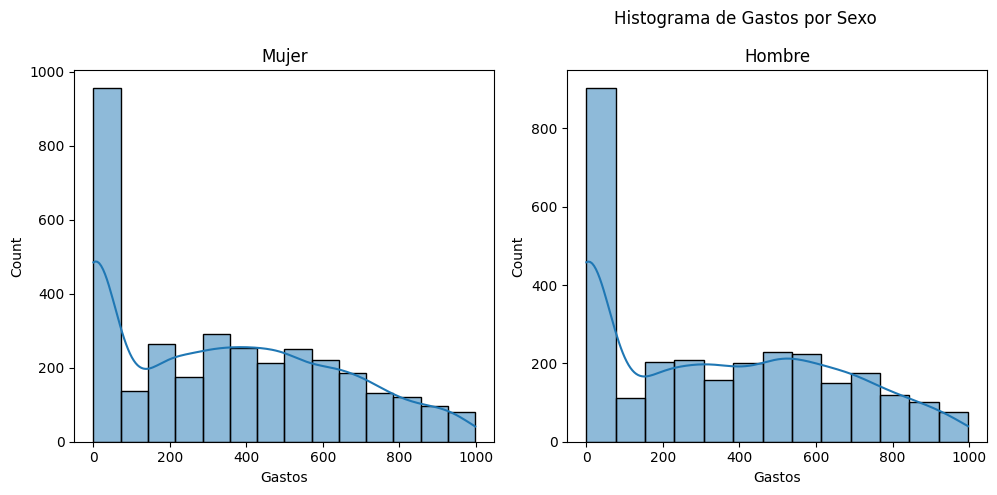

...

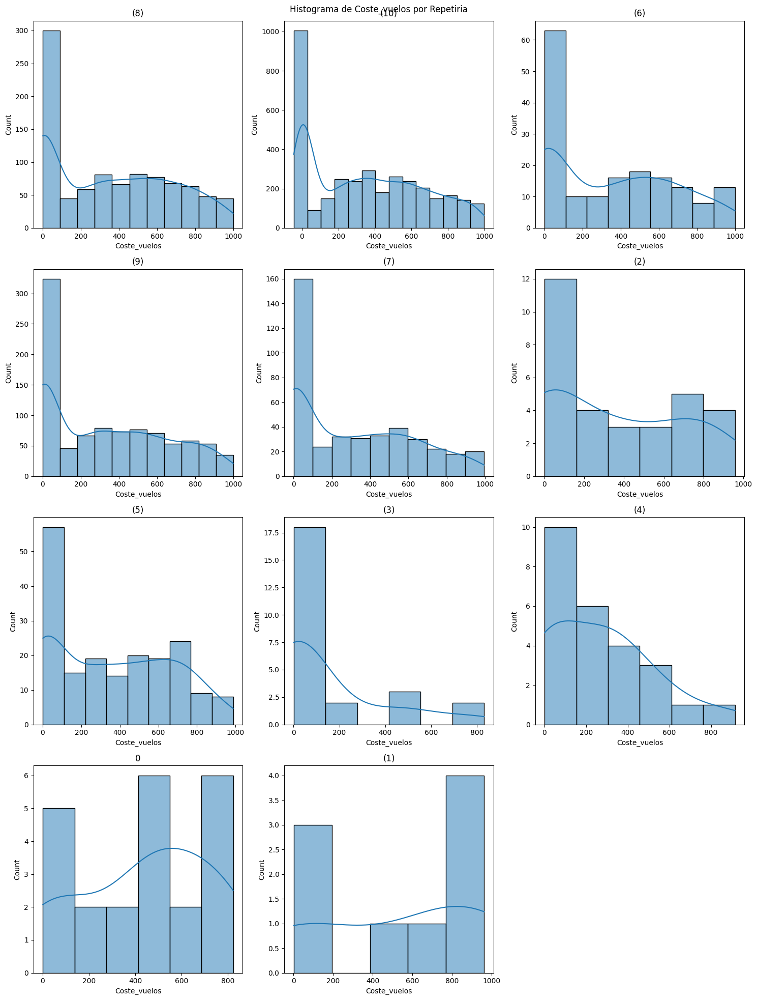

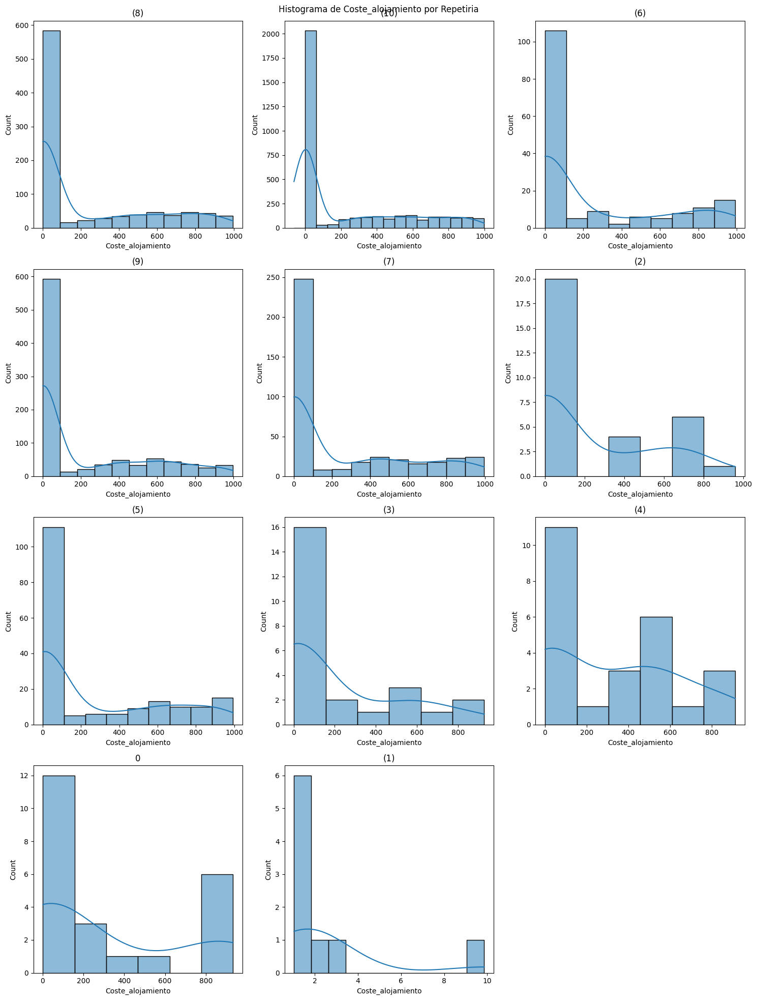

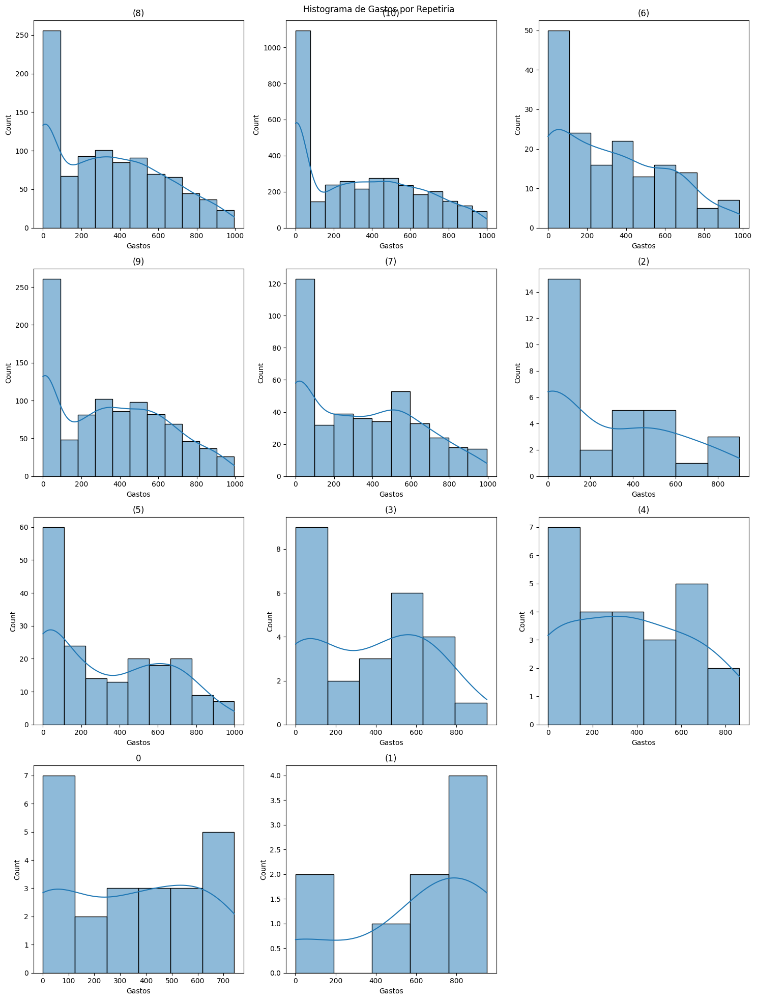

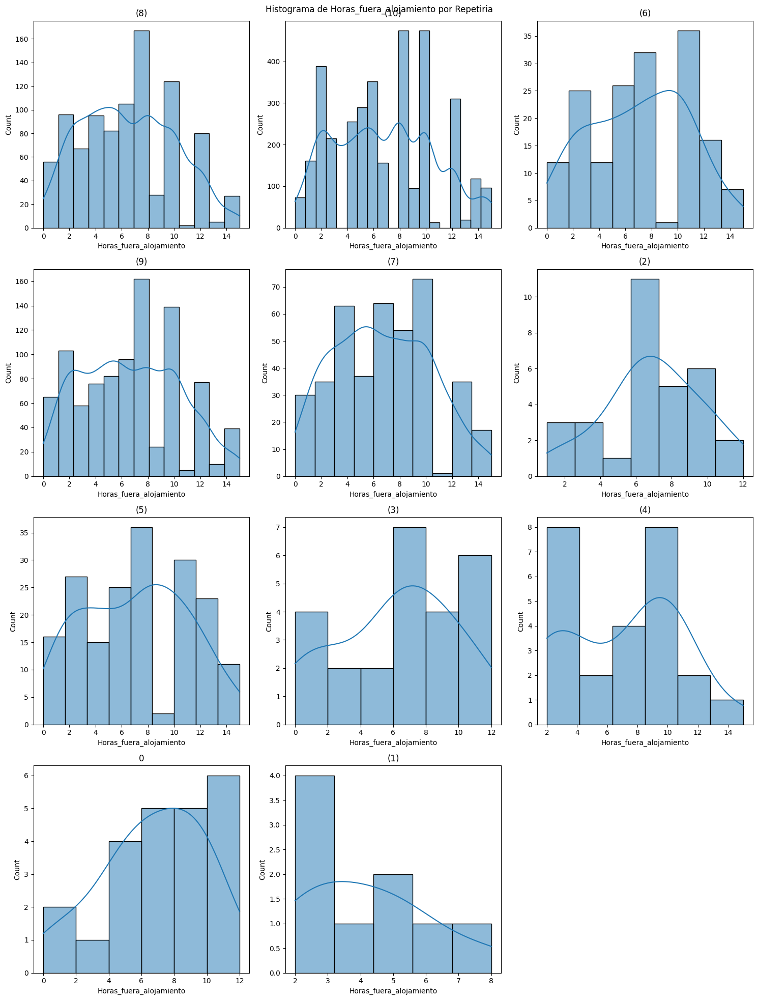

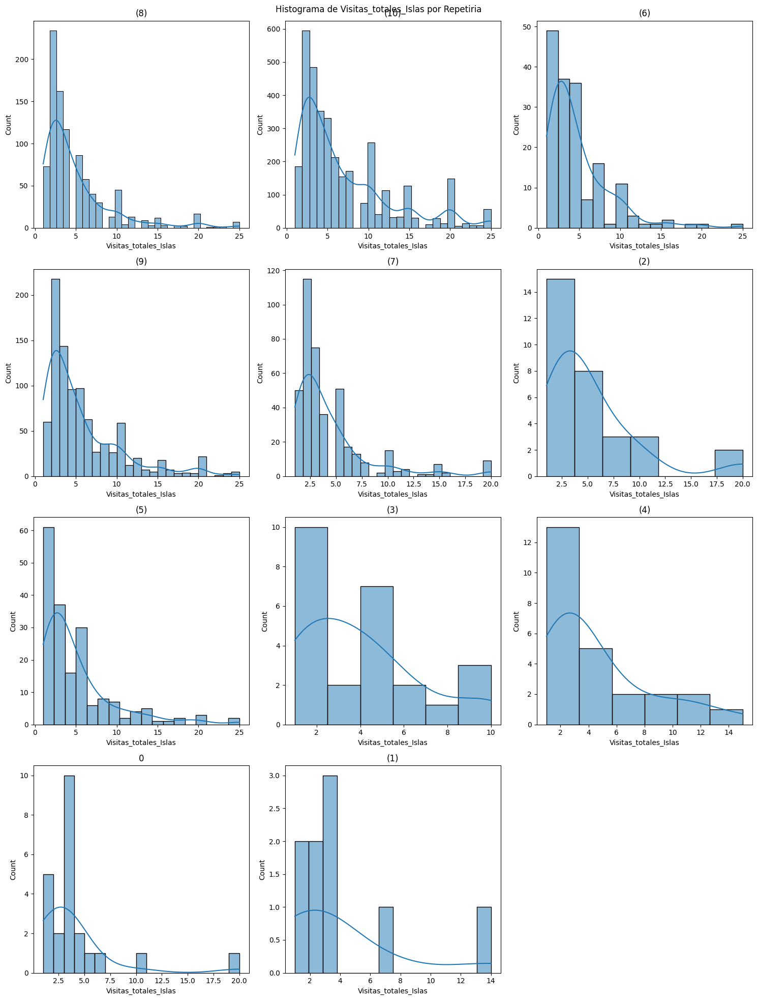

KeyboardInterrupt: 

In [4]:
for cat_col in variables_categoricas:
    for num_col in variables_numericas:
        plot_categorical_numerical_histograms(df_2022, cat_col, num_col)

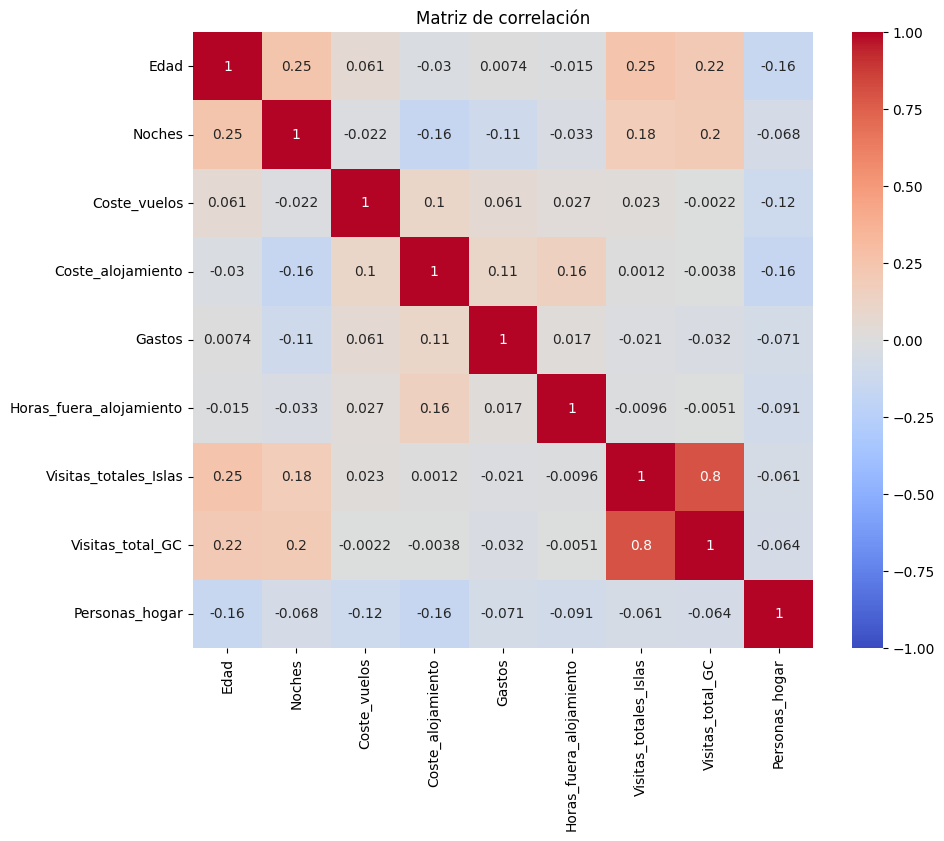

In [8]:
# Calcular la matriz de correlación
correlation_matrix = df_2022[variables_numericas].corr()

# Visualizar la matriz de correlación con un mapa de calor
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Matriz de correlación')
plt.show()

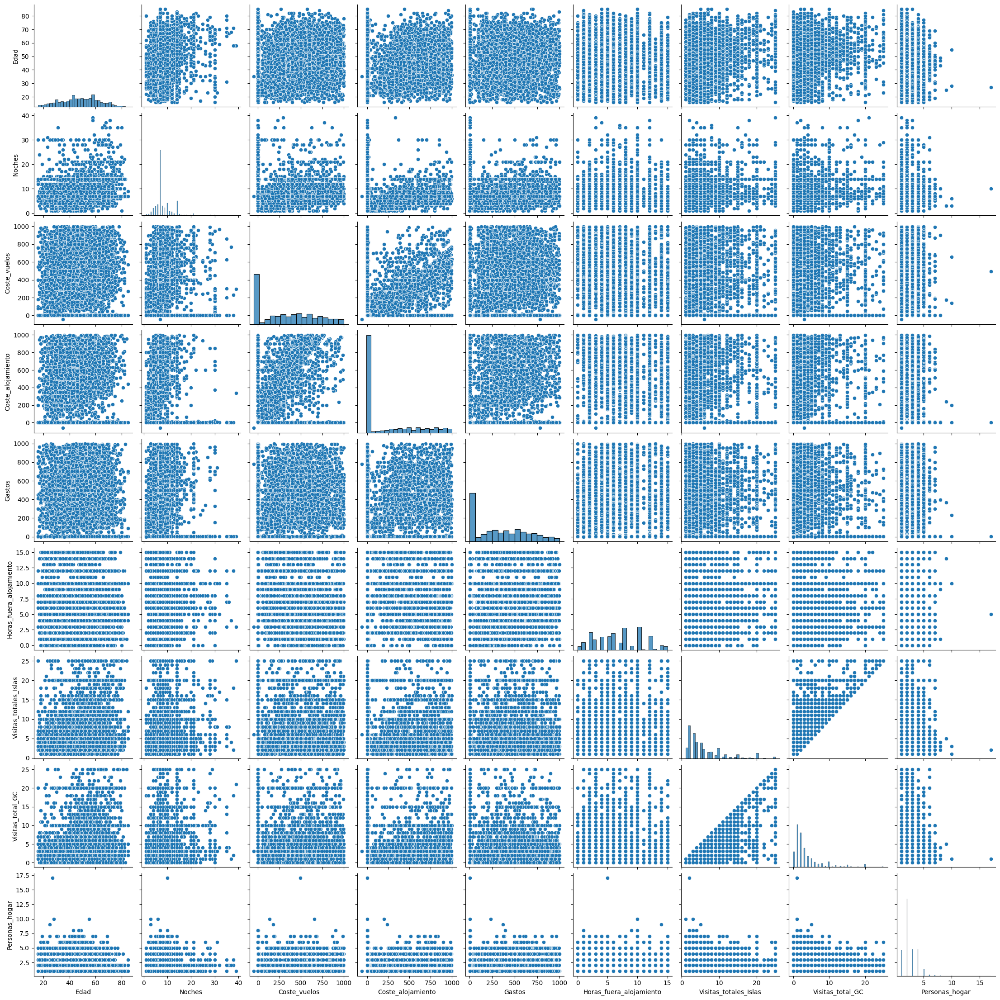

In [9]:
# Visualizar gráficos de dispersión para cada par de variables numéricas
sns.pairplot(df_2022[variables_numericas])
plt.show()